In [1]:
import os
import pickle
import matplotlib.pyplot as plt
import matplotlib
import seaborn as sns
import numpy as np
from rdkit import Chem
import rdkit

In [2]:
# ! scp ada:/share1/sriram.devata/IR_NMR_Results/n_mcts_400.tar.gz /ssd_scratch/users/sriram.devata/
# ! scp ada:/share1/sriram.devata/IR_NMR_Results/n_mcts_800.tar.gz /ssd_scratch/users/sriram.devata/
# ! scp ada:/share1/sriram.devata/IR_NMR_Results/only_ir_400.tar.gz /ssd_scratch/users/sriram.devata/
# ! scp ada:/share1/sriram.devata/IR_NMR_Results/only_nmr_400.tar.gz /ssd_scratch/users/sriram.devata/

# ! tar -xzvf /ssd_scratch/users/sriram.devata/n_mcts_400.tar.gz -C /ssd_scratch/users/sriram.devata/
# ! tar -xzvf /ssd_scratch/users/sriram.devata/n_mcts_800.tar.gz -C /ssd_scratch/users/sriram.devata/
# ! tar -xzvf /ssd_scratch/users/sriram.devata/only_ir_400.tar.gz -C /ssd_scratch/users/sriram.devata/
# ! tar -xzvf /ssd_scratch/users/sriram.devata/only_nmr_400.tar.gz -C /ssd_scratch/users/sriram.devata/

n_mcts_400.tar.gz                             100% 5806KB  35.5MB/s   00:00    
n_mcts_800.tar.gz                             100% 5846KB  41.8MB/s   00:00    
only_ir_400.tar.gz                            100% 7696KB  90.7MB/s   00:00    
only_nmr_400.tar.gz                           100% 6003KB  93.2MB/s   00:00    


In [2]:
! unzip -d /ssd_scratch/users/sriram.devata/ /home2/sriram.devata/Results_DeepSPInN/test_outputs_test_200.zip
! unzip -d /ssd_scratch/users/sriram.devata/ /home2/sriram.devata/Results_DeepSPInN/test_outputs_test_400.zip
! unzip -d /ssd_scratch/users/sriram.devata/ /home2/sriram.devata/Results_DeepSPInN/test_outputs_test_800.zip

! unzip -d /ssd_scratch/users/sriram.devata/ /home2/sriram.devata/Results_DeepSPInN/test_outputs_only_ir_200.zip
! unzip -d /ssd_scratch/users/sriram.devata/ /home2/sriram.devata/Results_DeepSPInN/test_outputs_only_nmr_200.zip

Archive:  /home2/sriram.devata/Results_DeepSPInN/test_outputs_test_200.zip
   creating: /ssd_scratch/users/sriram.devata/test_outputs_test_200/
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_200/output_6809.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_200/output_5025.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_200/output_2086.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_200/output_4946.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_200/output_9752.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_200/output_621.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_200/output_5218.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_200/output_474.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_200/output_7668.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_200/output_8136.pkl 

  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_200/output_164.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_200/output_8860.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_200/output_8265.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_200/output_1086.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_200/output_1351.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_200/output_3537.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_200/output_6464.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_200/output_6536.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_200/output_5373.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_200/output_5451.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_200/output_9547.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outp

  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_200/output_16.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_200/output_8676.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_200/output_6013.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_200/output_3554.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_200/output_5361.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_200/output_5903.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_200/output_5057.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_200/output_8515.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_200/output_9440.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_200/output_1455.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_200/output_7435.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outpu

  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_200/output_6328.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_200/output_5413.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_200/output_1719.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_200/output_5566.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_200/output_5698.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_200/output_4027.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_200/output_9606.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_200/output_7374.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_200/output_1286.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_200/output_5565.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_200/output_7229.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_out

  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_200/output_6076.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_200/output_9017.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_200/output_159.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_200/output_3634.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_200/output_2187.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_200/output_9820.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_200/output_5097.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_200/output_3126.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_200/output_3037.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_200/output_4452.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_200/output_5319.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outp

  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_200/output_6204.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_200/output_6857.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_200/output_1394.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_200/output_7322.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_200/output_7404.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_200/output_4076.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_200/output_5217.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_200/output_6026.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_200/output_1569.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_200/output_2990.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_200/output_4035.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_out

  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_200/output_5621.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_200/output_1409.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_200/output_8943.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_200/output_8298.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_200/output_1083.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_200/output_8483.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_200/output_2885.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_200/output_8412.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_200/output_8579.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_200/output_8541.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_200/output_8037.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_out

  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_200/output_2636.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_200/output_9195.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_200/output_7712.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_200/output_5417.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_200/output_5336.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_200/output_1977.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_200/output_9533.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_200/output_2826.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_200/output_6021.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_200/output_6306.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_200/output_7296.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_out

Archive:  /home2/sriram.devata/Results_DeepSPInN/test_outputs_test_400.zip
   creating: /ssd_scratch/users/sriram.devata/test_outputs_test_400/
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_400/output_6809.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_400/output_5025.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_400/output_2086.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_400/output_4946.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_400/output_9752.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_400/output_621.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_400/output_5218.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_400/output_474.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_400/output_7668.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_400/output_8136.pkl 

  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_400/output_2648.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_400/output_842.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_400/output_3510.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_400/output_4638.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_400/output_4767.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_400/output_1046.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_400/output_8141.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_400/output_9723.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_400/output_1967.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_400/output_8886.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_400/output_5654.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outp

  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_400/output_8606.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_400/output_8694.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_400/output_9552.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_400/output_8187.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_400/output_9498.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_400/output_4572.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_400/output_3241.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_400/output_8684.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_400/output_7620.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_400/output_2060.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_400/output_9312.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_out

  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_400/output_8512.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_400/output_788.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_400/output_2728.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_400/output_1242.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_400/output_718.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_400/output_2820.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_400/output_1582.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_400/output_1511.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_400/output_7652.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_400/output_8519.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_400/output_7443.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outpu

  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_400/output_7675.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_400/output_2679.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_400/output_1419.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_400/output_4540.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_400/output_8619.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_400/output_4314.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_400/output_3492.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_400/output_2595.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_400/output_2249.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_400/output_8750.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_400/output_4989.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_out

  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_400/output_1580.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_400/output_5410.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_400/output_2548.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_400/output_4814.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_400/output_6577.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_400/output_7036.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_400/output_3269.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_400/output_1353.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_400/output_780.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_400/output_9736.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_400/output_401.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outpu

  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_400/output_590.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_400/output_2012.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_400/output_6770.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_400/output_2577.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_400/output_8782.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_400/output_4515.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_400/output_2416.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_400/output_2891.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_400/output_2307.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_400/output_9883.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_400/output_3396.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outp

  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_400/output_8195.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_400/output_1500.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_400/output_7162.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_400/output_5632.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_400/output_6110.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_400/output_2596.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_400/output_8855.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_400/output_3009.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_400/output_7178.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_400/output_4534.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_400/output_4853.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_out

  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_400/output_3498.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_400/output_4311.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_400/output_418.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_400/output_3627.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_400/output_8797.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_400/output_9766.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_400/output_8087.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_400/output_4673.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_400/output_971.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_400/output_7112.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_test_400/output_4876.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outpu

unzip:  cannot find or open /home2/sriram.devata/Results_DeepSPInN/test_outputs_test_800.zip, /home2/sriram.devata/Results_DeepSPInN/test_outputs_test_800.zip.zip or /home2/sriram.devata/Results_DeepSPInN/test_outputs_test_800.zip.ZIP.
Archive:  /home2/sriram.devata/Results_DeepSPInN/test_outputs_only_ir_200.zip
   creating: /ssd_scratch/users/sriram.devata/test_outputs_only_ir_200/
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_ir_200/output_6809.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_ir_200/output_5025.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_ir_200/output_2086.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_ir_200/output_4946.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_ir_200/output_9752.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_ir_200/output_621.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_ir_200/output_521

  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_ir_200/output_2762.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_ir_200/output_9566.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_ir_200/output_9415.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_ir_200/output_695.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_ir_200/output_4952.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_ir_200/output_9648.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_ir_200/output_2072.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_ir_200/output_8482.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_ir_200/output_6839.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_ir_200/output_7820.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_ir_200/output_8739.pkl  
  inflating: /ssd_scra

  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_ir_200/output_3422.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_ir_200/output_9794.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_ir_200/output_7248.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_ir_200/output_8266.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_ir_200/output_4917.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_ir_200/output_453.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_ir_200/output_9255.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_ir_200/output_6980.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_ir_200/output_1113.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_ir_200/output_5147.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_ir_200/output_9215.pkl  
  inflating: /ssd_scra

  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_ir_200/output_8052.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_ir_200/output_7756.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_ir_200/output_7846.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_ir_200/output_6147.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_ir_200/output_8730.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_ir_200/output_189.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_ir_200/output_152.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_ir_200/output_4391.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_ir_200/output_7054.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_ir_200/output_6880.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_ir_200/output_8190.pkl  
  inflating: /ssd_scrat

  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_ir_200/output_7276.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_ir_200/output_2553.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_ir_200/output_9344.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_ir_200/output_6177.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_ir_200/output_7997.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_ir_200/output_3961.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_ir_200/output_4797.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_ir_200/output_5546.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_ir_200/output_6199.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_ir_200/output_1520.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_ir_200/output_4710.pkl  
  inflating: /ssd_scr

  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_ir_200/output_8788.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_ir_200/output_1345.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_ir_200/output_8669.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_ir_200/output_5815.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_ir_200/output_5490.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_ir_200/output_6902.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_ir_200/output_1423.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_ir_200/output_1827.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_ir_200/output_9658.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_ir_200/output_8432.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_ir_200/output_8861.pkl  
  inflating: /ssd_scr

  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_ir_200/output_8630.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_ir_200/output_1387.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_ir_200/output_80.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_ir_200/output_3798.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_ir_200/output_2567.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_ir_200/output_1319.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_ir_200/output_6539.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_ir_200/output_1811.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_ir_200/output_101.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_ir_200/output_3766.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_ir_200/output_5932.pkl  
  inflating: /ssd_scratc

  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_ir_200/output_4578.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_ir_200/output_4718.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_ir_200/output_2143.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_ir_200/output_7061.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_ir_200/output_30.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_ir_200/output_1675.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_ir_200/output_744.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_ir_200/output_6712.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_ir_200/output_491.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_ir_200/output_8596.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_ir_200/output_9361.pkl  
  inflating: /ssd_scratch

  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_ir_200/output_124.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_ir_200/output_7659.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_ir_200/output_3487.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_ir_200/output_8046.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_ir_200/output_8504.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_ir_200/output_9253.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_ir_200/output_3366.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_ir_200/output_5370.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_ir_200/output_7727.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_ir_200/output_4264.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_ir_200/output_9226.pkl  
  inflating: /ssd_scra

  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_ir_200/output_5488.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_ir_200/output_8810.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_ir_200/output_3125.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_ir_200/output_3524.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_ir_200/output_4403.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_ir_200/output_5334.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_ir_200/output_4290.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_ir_200/output_4255.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_ir_200/output_5789.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_ir_200/output_9338.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_ir_200/output_8950.pkl  
  inflating: /ssd_scr

  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_ir_200/output_2478.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_ir_200/output_1038.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_ir_200/output_1784.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_ir_200/output_9304.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_ir_200/output_4630.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_ir_200/output_8338.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_ir_200/output_1443.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_ir_200/output_9888.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_ir_200/output_8252.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_ir_200/output_3280.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_ir_200/output_1619.pkl  
  inflating: /ssd_scr

  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_ir_200/output_5126.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_ir_200/output_5043.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_ir_200/output_7125.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_ir_200/output_9231.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_ir_200/output_9768.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_ir_200/output_1154.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_ir_200/output_6359.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_ir_200/output_1809.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_ir_200/output_1887.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_ir_200/output_4245.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_ir_200/output_282.pkl  
  inflating: /ssd_scra

  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_ir_200/output_6561.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_ir_200/output_2975.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_ir_200/output_4151.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_ir_200/output_4131.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_ir_200/output_8920.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_ir_200/output_2711.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_ir_200/output_2117.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_ir_200/output_9232.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_ir_200/output_7086.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_ir_200/output_298.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_ir_200/output_7089.pkl  
  inflating: /ssd_scra

Archive:  /home2/sriram.devata/Results_DeepSPInN/test_outputs_only_nmr_200.zip
   creating: /ssd_scratch/users/sriram.devata/test_outputs_only_nmr_200/
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_nmr_200/output_6809.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_nmr_200/output_5025.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_nmr_200/output_2086.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_nmr_200/output_4946.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_nmr_200/output_9752.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_nmr_200/output_621.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_nmr_200/output_5218.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_nmr_200/output_474.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_nmr_200/output_7668.pkl  
  inflating: /ssd_scratch/users/sriram.d

  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_nmr_200/output_5482.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_nmr_200/output_1175.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_nmr_200/output_7255.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_nmr_200/output_3941.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_nmr_200/output_2914.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_nmr_200/output_1659.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_nmr_200/output_1756.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_nmr_200/output_1348.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_nmr_200/output_5839.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_nmr_200/output_7144.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_nmr_200/output_2762.pkl  
  inflatin

  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_nmr_200/output_2323.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_nmr_200/output_9781.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_nmr_200/output_9413.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_nmr_200/output_8091.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_nmr_200/output_4587.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_nmr_200/output_9181.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_nmr_200/output_6968.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_nmr_200/output_2389.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_nmr_200/output_2107.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_nmr_200/output_4800.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_nmr_200/output_5917.pkl  
  inflatin

  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_nmr_200/output_8478.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_nmr_200/output_8520.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_nmr_200/output_8611.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_nmr_200/output_984.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_nmr_200/output_5858.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_nmr_200/output_8109.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_nmr_200/output_1388.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_nmr_200/output_9058.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_nmr_200/output_8361.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_nmr_200/output_9913.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_nmr_200/output_7078.pkl  
  inflating

  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_nmr_200/output_4994.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_nmr_200/output_6828.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_nmr_200/output_4518.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_nmr_200/output_5180.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_nmr_200/output_3067.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_nmr_200/output_5906.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_nmr_200/output_9257.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_nmr_200/output_6265.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_nmr_200/output_637.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_nmr_200/output_6823.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_nmr_200/output_3089.pkl  
  inflating

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_nmr_200/output_847.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_nmr_200/output_2674.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_nmr_200/output_5296.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_nmr_200/output_3579.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_nmr_200/output_785.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_nmr_200/output_4526.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_nmr_200/output_6449.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_nmr_200/output_9119.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_nmr_200/output_1614.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_nmr_200/output_2952.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_only_nmr_200/output_4852.pkl  
  inflating

In [2]:
! unzip -d /ssd_scratch/users/sriram.devata/ /home2/sriram.devata/Results_DeepSPInN/test_outputs_val_400.zip

Archive:  /home2/sriram.devata/Results_DeepSPInN/test_outputs_val_200.zip
   creating: /ssd_scratch/users/sriram.devata/test_outputs_val_200/
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_val_200/output_2086.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_val_200/output_4946.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_val_200/output_621.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_val_200/output_474.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_val_200/output_1323.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_val_200/output_4842.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_val_200/output_2456.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_val_200/output_2488.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_val_200/output_3857.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_val_200/output_2156.pkl  
  inflatin

  inflating: /ssd_scratch/users/sriram.devata/test_outputs_val_200/output_1666.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_val_200/output_2742.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_val_200/output_4924.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_val_200/output_3030.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_val_200/output_4431.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_val_200/output_4044.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_val_200/output_4041.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_val_200/output_276.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_val_200/output_2346.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_val_200/output_3371.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_val_200/output_981.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_val_200/

  inflating: /ssd_scratch/users/sriram.devata/test_outputs_val_200/output_3894.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_val_200/output_3467.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_val_200/output_4414.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_val_200/output_3596.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_val_200/output_2600.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_val_200/output_23.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_val_200/output_3868.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_val_200/output_2296.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_val_200/output_4928.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_val_200/output_4641.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_val_200/output_3460.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_val_200/

  inflating: /ssd_scratch/users/sriram.devata/test_outputs_val_200/output_4149.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_val_200/output_2692.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_val_200/output_1679.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_val_200/output_1236.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_val_200/output_4276.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_val_200/output_543.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_val_200/output_2982.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_val_200/output_723.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_val_200/output_243.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_val_200/output_4922.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_val_200/output_3136.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_val_200/o

  inflating: /ssd_scratch/users/sriram.devata/test_outputs_val_200/output_1830.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_val_200/output_1820.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_val_200/output_1791.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_val_200/output_1376.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_val_200/output_1009.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_val_200/output_3309.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_val_200/output_3381.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_val_200/output_4384.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_val_200/output_2745.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_val_200/output_4772.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_val_200/output_3665.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_val_20

Archive:  /home2/sriram.devata/Results_DeepSPInN/test_outputs_val_400.zip
   creating: /ssd_scratch/users/sriram.devata/test_outputs_val_400/
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_val_400/output_2086.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_val_400/output_4946.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_val_400/output_621.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_val_400/output_474.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_val_400/output_1323.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_val_400/output_4842.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_val_400/output_2456.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_val_400/output_2488.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_val_400/output_3857.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_val_400/output_2156.pkl  
  inflatin

  inflating: /ssd_scratch/users/sriram.devata/test_outputs_val_400/output_1634.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_val_400/output_632.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_val_400/output_3186.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_val_400/output_619.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_val_400/output_64.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_val_400/output_912.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_val_400/output_3231.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_val_400/output_4709.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_val_400/output_937.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_val_400/output_2786.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_val_400/output_2618.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_val_400/outp

  inflating: /ssd_scratch/users/sriram.devata/test_outputs_val_400/output_3388.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_val_400/output_4250.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_val_400/output_288.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_val_400/output_3598.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_val_400/output_2246.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_val_400/output_304.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_val_400/output_1655.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_val_400/output_3578.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_val_400/output_2088.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_val_400/output_1371.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_val_400/output_802.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_val_400/o

  inflating: /ssd_scratch/users/sriram.devata/test_outputs_val_400/output_1268.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_val_400/output_4736.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_val_400/output_3632.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_val_400/output_1037.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_val_400/output_1166.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_val_400/output_1065.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_val_400/output_3563.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_val_400/output_1952.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_val_400/output_2039.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_val_400/output_3313.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_val_400/output_3295.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_val_40

  inflating: /ssd_scratch/users/sriram.devata/test_outputs_val_400/output_4303.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_val_400/output_1505.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_val_400/output_3249.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_val_400/output_674.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_val_400/output_172.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_val_400/output_1541.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_val_400/output_1997.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_val_400/output_113.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_val_400/output_299.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_val_400/output_2071.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_val_400/output_756.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_val_400/out

Archive:  /home2/sriram.devata/Results_DeepSPInN/test_outputs_val_800.zip
   creating: /ssd_scratch/users/sriram.devata/test_outputs_val_800/
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_val_800/output_2086.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_val_800/output_4946.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_val_800/output_621.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_val_800/output_474.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_val_800/output_1323.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_val_800/output_4842.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_val_800/output_2456.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_val_800/output_2488.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_val_800/output_3857.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_val_800/output_2156.pkl  
  inflatin

  inflating: /ssd_scratch/users/sriram.devata/test_outputs_val_800/output_2652.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_val_800/output_2959.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_val_800/output_1092.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_val_800/output_4296.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_val_800/output_3793.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_val_800/output_3317.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_val_800/output_1574.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_val_800/output_3345.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_val_800/output_2301.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_val_800/output_478.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_val_800/output_4432.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_val_800

  inflating: /ssd_scratch/users/sriram.devata/test_outputs_val_800/output_4243.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_val_800/output_4484.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_val_800/output_1575.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_val_800/output_3612.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_val_800/output_2489.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_val_800/output_3206.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_val_800/output_3935.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_val_800/output_4280.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_val_800/output_1292.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_val_800/output_223.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_val_800/output_3676.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_val_800

  inflating: /ssd_scratch/users/sriram.devata/test_outputs_val_800/output_918.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_val_800/output_4626.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_val_800/output_3589.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_val_800/output_4263.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_val_800/output_4436.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_val_800/output_4669.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_val_800/output_1538.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_val_800/output_1842.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_val_800/output_1623.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_val_800/output_571.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_val_800/output_3810.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_val_800/

In [16]:
sriram_test_path = '/ssd_scratch/users/sriram.devata/test_outputs_test_400/'

all_files = os.listdir(sriram_test_path)
all_files = [sriram_test_path+x for x in all_files if ".pkl" in x]
all_files = sorted(all_files, key=lambda x:int(x.split('_')[-1].split('.')[0]))

mol_time = dict()
all_times = list()

for filename in all_files:
    with open(filename, 'rb') as f: # open in readonly mode
        current_mol_log = pickle.load(f)
        
    smiles = current_mol_log[0][0]
    
    time_taken = list()
    for episode_log in current_mol_log:
        time_taken.append(episode_log[-1])
        break
    time_taken = np.mean(time_taken)
    
    mol = Chem.MolFromSmiles(smiles)
    num_atoms = len(mol.GetAtoms())
    if num_atoms in mol_time:
        mol_time[num_atoms].append(time_taken)
    else:
        mol_time[num_atoms] = list()
    
    if time_taken <= 2000:
        all_times.append(time_taken)


In [17]:
sns.set(style="whitegrid")
sns.set_style("whitegrid")
sns.set(rc={'figure.figsize':(15,8)})

<Figure size 1500x800 with 0 Axes>

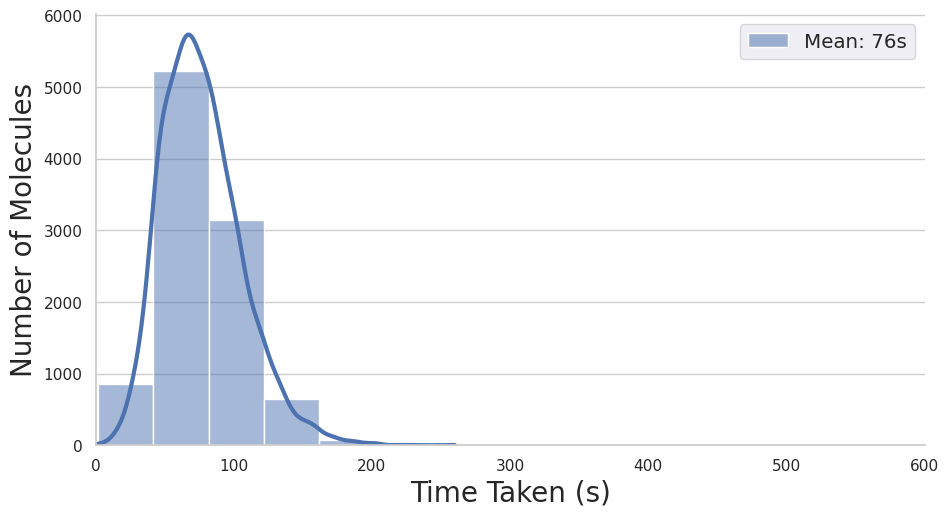

In [18]:
fig = plt.figure(figsize=(15,8))

# sns.kdeplot(all_times, fill=True, color='g')
# sns.histplot(all_times, 
#              binwidth=30, 
#             stat='count')


# with sns.axes_style("whitegrid"):
#     ax = sns.displot(all_times, 
#              binwidth=40, 
#             kde=True,
#             stat='count',
#             height=8, aspect=15/8,
#                 label=f"Mean: {int(np.mean(all_times))}s")

with sns.axes_style("whitegrid"):
    ax = sns.displot(all_times, 
            kind="hist",
            kde=True,
            aspect=15/8,
            line_kws={'linewidth': 3},
            binwidth=40,
            label=f"Mean: {int(np.mean(all_times))}s")

    
# with sns.axes_style("whitegrid"):
#     ax = sns.distplot(all_times, 
#                       kde_kws=dict(linewidth=5),
#                 label=f"Mean: {int(np.mean(all_times))}s")

    
# ax.set(title="Histogram of time taken for each molecule")
# ax.set(xlabel='Time Taken (s)', ylabel='Number of Molecules', fontsize = 20)

sns.set(font_scale = 1.3)
plt.xlim(0, 600)


plt.xlabel("Time Taken (s)", fontsize = 20)
plt.ylabel("Number of Molecules", fontsize = 20)
plt.grid(axis="x")
plt.legend()


# plt.savefig('Images/time_taken.svg', dpi=300, bbox_inches = "tight")
plt.show()

In [20]:
print(sorted(all_times)[int(len(all_times) * 0.95)])

128.9330632686615


In [32]:
sriram_test_path = '/ssd_scratch/users/sriram.devata/test_outputs_test_400/'

all_files = os.listdir(sriram_test_path)
all_files = [sriram_test_path+x for x in all_files if ".pkl" in x]
all_files = sorted(all_files, key=lambda x:int(x.split('_')[-1].split('.')[0]))

mol_time = dict()
all_times_400 = list()

for filename in all_files:
    with open(filename, 'rb') as f: # open in readonly mode
        current_mol_log = pickle.load(f)
        
    smiles = current_mol_log[0][0]
    
    time_taken = list()
    for episode_log in current_mol_log:
        time_taken.append(episode_log[-1])
        break
    time_taken = np.mean(time_taken)
    
    mol = Chem.MolFromSmiles(smiles)
    num_atoms = len(mol.GetAtoms())
    if num_atoms in mol_time:
        mol_time[num_atoms].append(time_taken)
    else:
        mol_time[num_atoms] = list()
        
    all_times_400.append(time_taken)
    
sriram_test_path = '/ssd_scratch/users/sriram.devata/test_outputs_test_200/'

all_files = os.listdir(sriram_test_path)
all_files = [sriram_test_path+x for x in all_files if ".pkl" in x]
all_files = sorted(all_files, key=lambda x:int(x.split('_')[-1].split('.')[0]))

mol_time = dict()
all_times_200 = list()

for filename in all_files:
    with open(filename, 'rb') as f: # open in readonly mode
        current_mol_log = pickle.load(f)
        
    smiles = current_mol_log[0][0]
    
    time_taken = list()
    for episode_log in current_mol_log:
        time_taken.append(episode_log[-1])
        break
    time_taken = np.mean(time_taken)
    
    mol = Chem.MolFromSmiles(smiles)
    num_atoms = len(mol.GetAtoms())
    if num_atoms in mol_time:
        mol_time[num_atoms].append(time_taken)
    else:
        mol_time[num_atoms] = list()
        
    all_times_200.append(time_taken)

In [33]:
import pandas as pd

df = pd.DataFrame(columns = ['Time', 'n_mcts'])


times = [all_times_200, all_times_400]
n_mcts_vals = [200,400]
for idx, n_mcts in enumerate(n_mcts_vals):
    print("n_mcts:", n_mcts)
    for time_val in times[idx]:
        if int(time_val) <= 2000:
            # df = df.append({'Time': float(time_val), 'n_mcts': int(n_mcts)}, 
            #     ignore_index = True)
            df = pd.concat([df, pd.DataFrame.from_dict({'Time': [float(time_val)], 'n_mcts': [int(n_mcts)]})], ignore_index=True)


print(df)

n_mcts: 200
n_mcts: 400
             Time n_mcts
0       59.815362    200
1       28.387543    200
2       48.077542    200
3       40.750973    200
4       41.955125    200
...           ...    ...
19897   89.078279    400
19898  120.817386    400
19899   47.954847    400
19900   69.100670    400
19901   89.240023    400

[19902 rows x 2 columns]


0.0072025211941486155
0.010252525971130438


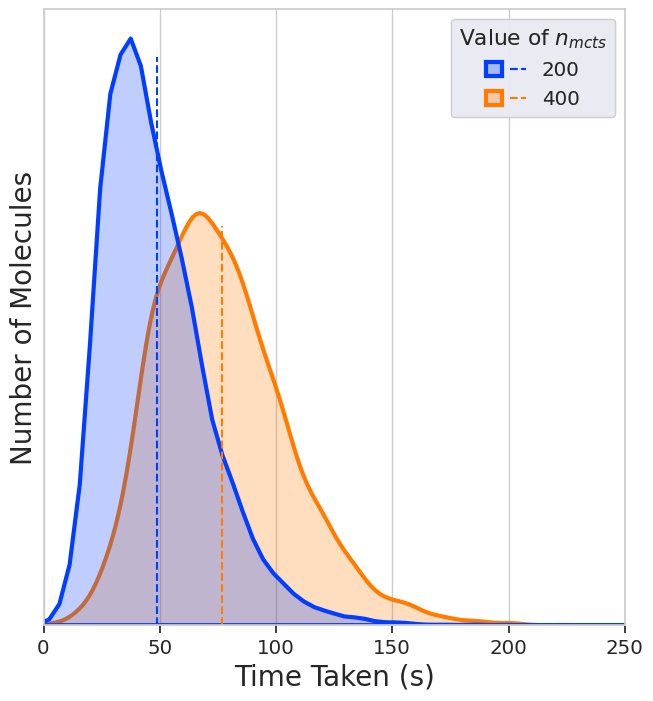

In [35]:
#ax = sns.displot(data=df, x='Time', hue='n_mcts', kind='hist', kde=True, fill=False, color='b', palette=sns.color_palette('bright')[:4], height=5, aspect=1.5)

# ax = sns.displot(data=df, x='Time', hue='n_mcts', kind='kde', fill=True, palette=sns.color_palette('bright')[:4], height=5, aspect=1.5)


fig = plt.figure(figsize=(7.5,8))

n_mcts_labels = [ "200", "400"]

color_palette = sns.color_palette('bright')[:4]

kde_plots = list()
kde_labels = list()
mean_lines = list()
with sns.axes_style("whitegrid"):
    kde = sns.kdeplot(data=df, x='Time', hue='n_mcts', fill=True, palette=color_palette[:len(n_mcts_labels)], linewidth=3)    
    old_legend = kde.legend_
    kde_plots = old_legend.legendHandles
    kde_labels = [t.get_text() for t in old_legend.get_texts()]
                
    for i, kde_plot in enumerate(kde.collections):
        max_y = max(kde_plot.get_paths()[0].vertices[:,1])
        print(max_y)
       
        mean_line = plt.axvline(np.mean(times[-i-1]), 0, max_y * 90, color=sns.color_palette('bright')[len(n_mcts_labels)-i-1], ls='--')
        mean_lines.append(mean_line)

# ax.set(title="Histogram of time taken for each molecule for different n_mcts values")
# ax.set(xlabel='Time Taken (s)', ylabel='Number of Molecules')


sns.set(font_scale = 1.3)
plt.xlim(0, 250)

plt.tick_params(left = False, right = False , labelleft = False , labelbottom = True, bottom = True)

plt.xlabel("Time Taken (s)", fontsize = 20)
plt.ylabel("Number of Molecules", fontsize = 20)
plt.grid(axis="y")

# old_legend = plt.legend(handles=kde_plots, labels=kde_labels, loc=1, title="n_mcts value")
# plt.gca().add_artist(old_legend)
# new_legend = plt.legend(mean_lines, n_mcts_labels, loc=4, title="Mean for n_mcts")
# plt.gca().add_artist(new_legend)

combined_legend = plt.legend(list(zip(kde_plots, mean_lines[::-1])), n_mcts_labels,
               handler_map={tuple: matplotlib.legend_handler.HandlerTuple(ndivide=None)}, title="Value of $n_{mcts}$")
plt.gca().add_artist(combined_legend)

# plt.savefig('Images/n_mcts_time.svg', dpi=300)
plt.show()

### Minimum Threshold notebook has images for the SI

In [25]:
print(np.mean(all_times_200))
print(np.mean(all_times_400))

48.78547525163895
76.85252554358435


### Only IR and Only NMR

In [26]:
sriram_test_path = '/ssd_scratch/users/sriram.devata/test_outputs_test_200/'

all_files = os.listdir(sriram_test_path)
all_files = [sriram_test_path+x for x in all_files if ".pkl" in x]
all_files = sorted(all_files, key=lambda x:int(x.split('_')[-1].split('.')[0]))

mol_time = dict()
all_times_200 = list()

for filename in all_files:
    with open(filename, 'rb') as f: # open in readonly mode
        current_mol_log = pickle.load(f)
        
    smiles = current_mol_log[0][0]
    
    time_taken = list()
    for episode_log in current_mol_log:
        time_taken.append(episode_log[-1])
        break
    time_taken = np.mean(time_taken)
    
    mol = Chem.MolFromSmiles(smiles)
    num_atoms = len(mol.GetAtoms())
    if num_atoms in mol_time:
        mol_time[num_atoms].append(time_taken)
    else:
        mol_time[num_atoms] = list()
        
    all_times_200.append(time_taken)

sriram_test_path = '/ssd_scratch/users/sriram.devata/test_outputs_only_ir_200/'

all_files = os.listdir(sriram_test_path)
all_files = [sriram_test_path+x for x in all_files if ".pkl" in x]
all_files = sorted(all_files, key=lambda x:int(x.split('_')[-1].split('.')[0]))

mol_time = dict()
all_times_ir_200 = list()

for filename in all_files:
    with open(filename, 'rb') as f: # open in readonly mode
        current_mol_log = pickle.load(f)
        
    smiles = current_mol_log[0][0]
    
    time_taken = list()
    for episode_log in current_mol_log:
        time_taken.append(episode_log[-1])
        break
    time_taken = np.mean(time_taken)
    
    mol = Chem.MolFromSmiles(smiles)
    num_atoms = len(mol.GetAtoms())
    if num_atoms in mol_time:
        mol_time[num_atoms].append(time_taken)
    else:
        mol_time[num_atoms] = list()
        
    all_times_ir_200.append(time_taken)
    
sriram_test_path = '/ssd_scratch/users/sriram.devata/test_outputs_only_nmr_200/'

all_files = os.listdir(sriram_test_path)
all_files = [sriram_test_path+x for x in all_files if ".pkl" in x]
all_files = sorted(all_files, key=lambda x:int(x.split('_')[-1].split('.')[0]))

mol_time = dict()
all_times_nmr_200 = list()

for filename in all_files:
    with open(filename, 'rb') as f: # open in readonly mode
        current_mol_log = pickle.load(f)
        
    smiles = current_mol_log[0][0]
    
    time_taken = list()
    for episode_log in current_mol_log:
        time_taken.append(episode_log[-1])
        break
    time_taken = np.mean(time_taken)
    
    mol = Chem.MolFromSmiles(smiles)
    num_atoms = len(mol.GetAtoms())
    if num_atoms in mol_time:
        mol_time[num_atoms].append(time_taken)
    else:
        mol_time[num_atoms] = list()
        
    all_times_nmr_200.append(time_taken)


In [27]:
print(np.mean(all_times_200))
print(np.mean(all_times_ir_200))
print(np.mean(all_times_nmr_200))

48.78547525163895
82.90992613608317
24.48492179589228


In [28]:
import pandas as pd

df = pd.DataFrame(columns = ['Time', 'Input Spectra'])


times = [all_times_200, all_times_ir_200, all_times_nmr_200]
captions = ["IR and NMR", "Only IR", "Only NMR"]
for idx, caption in enumerate(captions):
    print("Caption:", caption)
    for time_val in times[idx]:
        if int(time_val) <= 2000:
            # df = df.append({'Time': float(time_val), 'Input Spectra': caption}, 
            #     ignore_index = True)
            df = pd.concat([df, pd.DataFrame.from_dict({'Time': [float(time_val)], 'Input Spectra': [caption]})], ignore_index=True)


print(df)

Caption: IR and NMR
Caption: Only IR
Caption: Only NMR
            Time Input Spectra
0      59.815362    IR and NMR
1      28.387543    IR and NMR
2      48.077542    IR and NMR
3      40.750973    IR and NMR
4      41.955125    IR and NMR
...          ...           ...
29848  22.251985      Only NMR
29849  19.710301      Only NMR
29850  15.155659      Only NMR
29851  18.009618      Only NMR
29852  32.626391      Only NMR

[29853 rows x 2 columns]


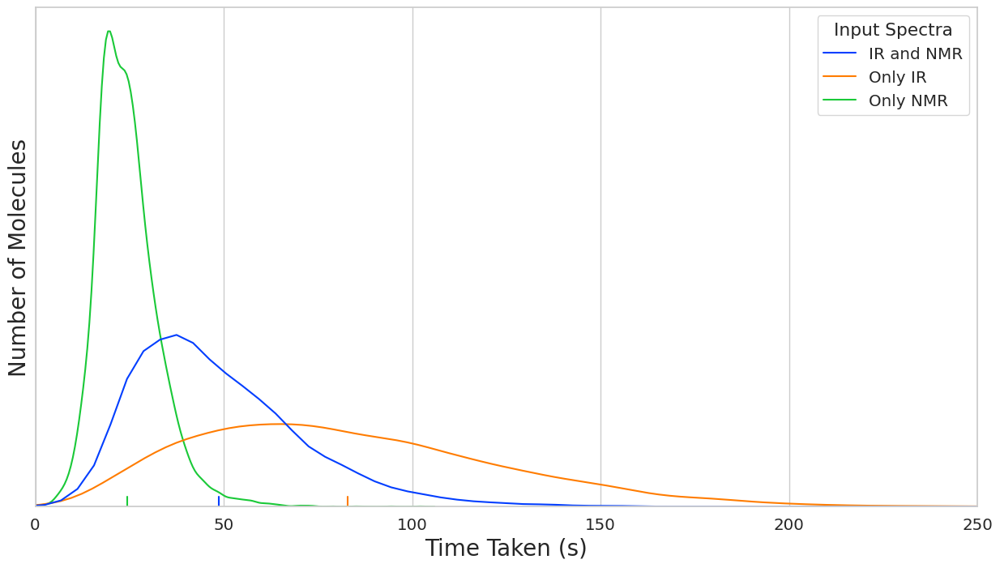

In [29]:
plt.figure(figsize=(15,8))

with sns.axes_style("whitegrid"):
    
    ax = sns.kdeplot(data=df, x='Time', hue='Input Spectra', fill=False, palette=sns.color_palette('bright')[:3])
    ax.set(yticks=[])

    for i in range(len(times)):
        plt.axvline(np.mean(times[i]), 0, 0.02, color=sns.color_palette('bright')[i])


# ax.set(title="Histogram of time taken for IR-and-NMR-trained, IR-trained, and NMR-trained models")
# ax.set(xlabel='Time Taken (s)', ylabel='Number of Molecules')

sns.set(font_scale = 1.3)
plt.xlim(0, 250)


plt.xlabel("Time Taken (s)", fontsize = 20)
plt.ylabel("Number of Molecules", fontsize = 20)
plt.grid(axis="y")

# plt.savefig('Images/only_ir_nmr_time.svg', dpi=300)
plt.show()


0.018921453038812
0.0032861091627519345
0.006835017314086958


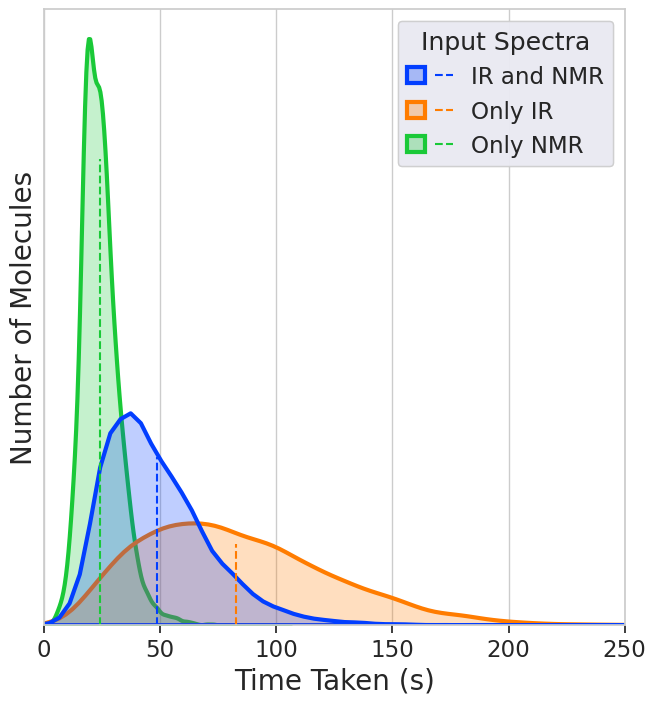

In [31]:
from matplotlib.legend_handler import HandlerTuple

fig = plt.figure(figsize=(7.5,8))

input_labels = ["IR and NMR", "Only IR", "Only NMR"]

kde_plots = list()
kde_labels = list()
mean_lines = list()
with sns.axes_style("whitegrid"):
    kde = sns.kdeplot(data=df, x='Time', hue='Input Spectra', fill=True, palette=sns.color_palette('bright')[:3], linewidth=3)    
    old_legend = kde.legend_
    kde_plots = old_legend.legendHandles
    kde_labels = [t.get_text() for t in old_legend.get_texts()]
                
    for i, kde_plot in enumerate(kde.collections):
        max_y = max(kde_plot.get_paths()[0].vertices[:,1])
        print(max_y)
       
        mean_line = plt.axvline(np.mean(times[-i-1]), 0, max_y * 40, color=sns.color_palette('bright')[3-i-1], ls='--')
        mean_lines.append(mean_line)

# ax.set(title="Histogram of time taken for each molecule for different n_mcts values")
# ax.set(xlabel='Time Taken (s)', ylabel='Number of Molecules')


sns.set(font_scale = 1.5)
plt.xlim(0, 250)

plt.tick_params(left = False, right = False , labelleft = False , labelbottom = True, bottom = True)

plt.xlabel("Time Taken (s)", fontsize = 20)
plt.ylabel("Number of Molecules", fontsize = 20)
plt.grid(axis="y")

# old_legend = plt.legend(handles=kde_plots, labels=kde_labels, loc=1, title="Input Spectra")
# plt.gca().add_artist(old_legend)
# new_legend = plt.legend(mean_lines, input_labels, loc=4, title="Mean for Input Spectra")
# plt.gca().add_artist(new_legend)

combined_legend = plt.legend(list(zip(kde_plots, mean_lines[::-1])), input_labels,
               handler_map={tuple: HandlerTuple(ndivide=None)}, title="Input Spectra")
plt.gca().add_artist(combined_legend)

# plt.savefig('Images/only_ir_nmr_time.svg', dpi=300)
plt.show()

In [2]:
with open('/ssd_scratch/users/sriram.devata/qm9_clean_ir_nmr.pickle', 'rb') as handle:
    ir_all_datasets = pickle.load(handle)
ir_nmr_dat = ir_all_datasets["test"]

('CC1CCOC1C=O', [6, 0, 2, 0], array([4.6374913e-05, 4.6960080e-05, 4.7096866e-05, ..., 1.1752577e-04,
       1.1938816e-04, 1.1575836e-04]), [(12.459491513005247, 3), (40.686426656077685, 1), (31.952027142777837, 2), (68.37800571491988, 2), (86.9811372246256, 1), (206.46087599648385, 1)], 'dsgdb9nsd_015600')


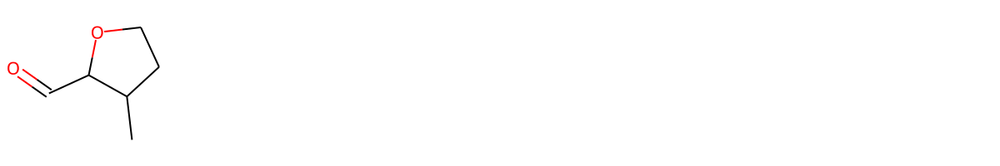

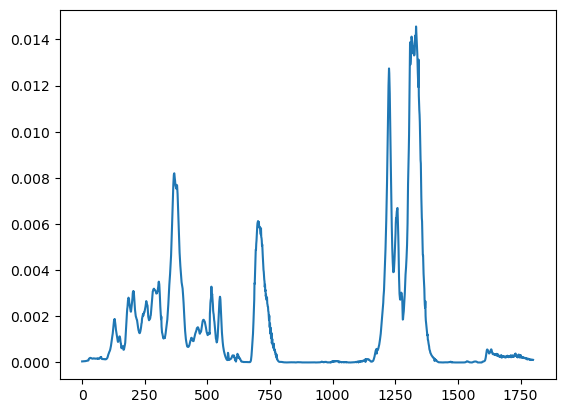

In [26]:
data = ir_nmr_dat[20]

print(data)
with open('Images/forward_inverse/molecule_nmr.txt', 'w') as f_handle:
    f_handle.write(str(data[3]))
img = Chem.Draw.MolsToGridImage([Chem.MolFromSmiles(data[0])], molsPerRow=6, useSVG=True)
display(img)
with open('Images/forward_inverse/molecule.svg', 'w') as f_handle:
    f_handle.write(img.data)

plt.plot(data[2])
plt.savefig('Images/forward_inverse/ir_spectra.png', dpi=300)
plt.show()

In [16]:
import os
import sys
import pickle
import numpy as np
from rdkit import Chem
from rdkit.Chem import rdMolDescriptors
from tqdm import tqdm

print_mols = False

num_total = 0
num_top_1 = 0
num_top_3 = 0
num_top_5 = 0
num_top_10 = 0
num_top_40 = 0

top_n_similarities = [list() for i in range(5)]

all_mols = list()
wrong_mols = list()
wrong_mols_nums = list()

#for filename in os.listdir('/home2/sriram.devata/MCTS/irInverse/test/test_outputs'):
sriram_test_path = '/ssd_scratch/users/sriram.devata/n_mcts_800/'


all_files = os.listdir(sriram_test_path)
all_files = [sriram_test_path+x for x in all_files]

all_files = sorted(all_files, key=lambda x:int(x.split('_')[-1].split('.')[0]))

for filename in tqdm(all_files):
    with open(filename, 'rb') as f: # open in readonly mode
        current_mol_log = pickle.load(f)
        
    mol_id = int(filename.split('_')[-1].split('.')[0])
    all_mols.append(mol_id)
    
    smiles_scores = dict()
    all_smiles = list()
    
    for episode_result in current_mol_log:
        reached_mol = Chem.CanonSmiles(episode_result[2][-1])
        all_smiles.append(reached_mol)
        smiles_scores[reached_mol] = episode_result[3]
    
    all_smiles = list(set(all_smiles))
    all_smiles = sorted(all_smiles, key=lambda x: smiles_scores[x], reverse=True)
    
    num_total += 1
    
    target_smiles = Chem.CanonSmiles(current_mol_log[0][0])
    if print_mols:
        print('Top hits for', target_smiles, filename.split('/')[-1])
    idx = 0
    while idx < len(all_smiles):
        hit = all_smiles[idx]
        
        if hit == target_smiles:
            if idx < 5 and print_mols:
                print('\t', idx, hit.ljust(20), str(smiles_scores[hit]), '<---')
            elif print_mols:
                print('\t', idx, hit.ljust(20), str(smiles_scores[hit]), 'vvv')
            if idx < 1:
                num_top_1 += 1
            if idx < 3:
                num_top_3 += 1
            if idx < 5:
                num_top_5 += 1
            if idx < 10:
                num_top_10 += 1
            if idx < 40:
                num_top_40 += 1
        elif idx < 5 and print_mols:
            print('\t', idx, hit.ljust(20), str(smiles_scores[hit]))

        idx += 1
        
    for idx, smiles in enumerate(all_smiles):
        if idx > 4:
            break
        top_n_similarities[idx].append(
            rdkit.DataStructs.FingerprintSimilarity(
                rdMolDescriptors.GetMorganFingerprintAsBitVect(
            Chem.MolFromSmiles(smiles)
                    , radius=3, nBits=2048, useChirality=0,
                    useBondTypes=1, useFeatures=0),
                rdMolDescriptors.GetMorganFingerprintAsBitVect(
            Chem.MolFromSmiles(target_smiles)
                    , radius=3, nBits=2048, useChirality=0,
                    useBondTypes=1, useFeatures=0)
            )
        )

    if target_smiles not in all_smiles:
        wrong_mols.append(target_smiles)
        wrong_mols_nums.append(int(filename.split('_')[-1].split('.')[0]))
        if print_mols:
            print('Paste in cheminfo:')
            print(target_smiles, current_mol_log[0][1])
            print('\n'.join(all_smiles[:5]))

print('Wrong mols', wrong_mols)
print(wrong_mols_nums)

print('Top 1 (%):', 100.0* num_top_1/num_total)
print('Top 3 (%):', 100.0* num_top_3/num_total)
print('Top 5 (%):', 100.0* num_top_5/num_total)
print('Top 10 (%):', 100.0* num_top_10/num_total)
print('Top 40 (%):', 100.0* num_top_40/num_total)
print(num_total, 'mols are done so far')

print('\n\nRanges done so far:')
all_mols = sorted(list(set(all_mols)))
for idx,num in enumerate(all_mols):
    if idx == 0:
        print(f'{num} - ', end='')
    elif num - all_mols[idx-1] != 1:
        print(f'{all_mols[idx-1]}\n{num} - ', end='')
    elif idx == len(all_mols)-1:
        print(f'{num}')


100%|██████████| 4975/4975 [00:24<00:00, 202.01it/s]

Wrong mols ['COc1c[nH]c(C=O)n1', 'CNc1onnc1C=O', 'C#CC1=CCOC=NC1', 'Cc1ccncc(=O)n1', 'CC1C(=NO)C=CN1C', 'CCN=C(C#N)NC=N', 'N#Cc1cnn(C=O)n1', 'COC1OCCNC1=N', 'CCOC(=O)NCC#N', 'Cn1nc[nH]c(=N)c1=O', 'COc1c(N)nnn1C', 'CN=CNC(=O)C(C)O', 'CC(C)n1nnc(N)n1', 'N#Cc1cnnoc1=N', 'OCCNc1c[nH]nn1', 'Oc1nnn2c1OCC2', 'C#CCN=C1COCO1', 'Nc1cnn(CC=O)n1', 'c1cc2nconc-2n1', 'Oc1cc2n(c1)CCC2', 'CNC(CO)C(=O)OC', 'C#CCN(C=O)CC#C', 'CCNc1cnc(N)o1', 'CNC(=O)N(C=O)C=O', 'Cc1nc(=O)nc(N)o1', 'N=c1cnn(C=O)nn1', 'CN=c1ncoc(=O)o1', 'CNc1c[nH]ncc1=O', 'Nc1[nH]ncc(=O)c1N', 'CC(=O)n1ncc(O)n1', 'Nc1nc(=O)cc(O)[nH]1', 'O=CC(=O)n1cnnc1', 'C#Cc1noc(=NC)o1', 'CN(C=N)c1cnno1', 'Cn1c(O)nc(N)c1N', 'COC1OCCC=C1C', 'CN(C=N)c1c[nH]nn1', 'N#CCn1ccnc1O', 'c1cc2nonnc-2n1', 'CNC1C(=O)OCC1O', 'COC(=N)n1cncn1', 'Nc1ncnccc1=O', 'C1OCC2COCC1N2', 'N=C1C=CNCC(=O)O1', 'CNc1cncc(=N)o1', 'Nc1cc(=O)c(O)c[nH]1', 'CC(CO)N=CNC=O', 'Cn1cc(O)c(=O)cn1', 'CCC(O)C(C)(C)OC', 'C#CC(N)C(=O)N(C)C', 'C1=CC2CCC(C=C1)O2', 'N#CC1CCOC(N)=N1', 'Cn1cc(OC=O)nn1', 

In [17]:
for sims in top_n_similarities:
    print(np.mean(sims), len(sims))

0.9701590316264344 4975
0.2900944720879988 4970
0.24866524715856803 4953
0.2171634802808419 4931
0.1949708056086422 4908


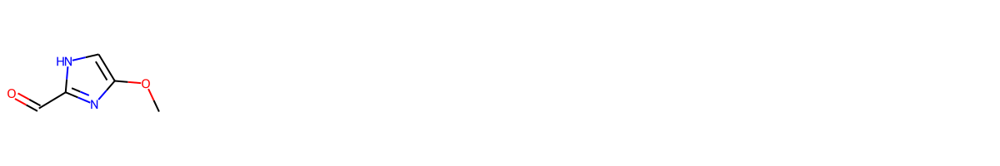

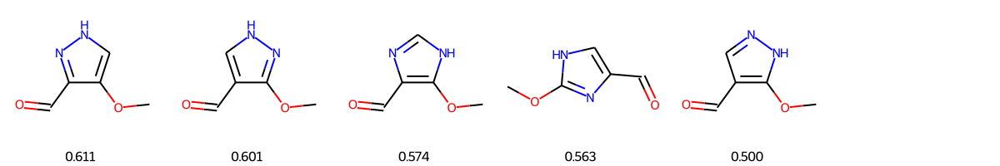

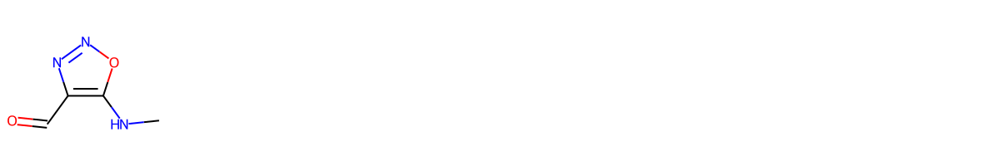

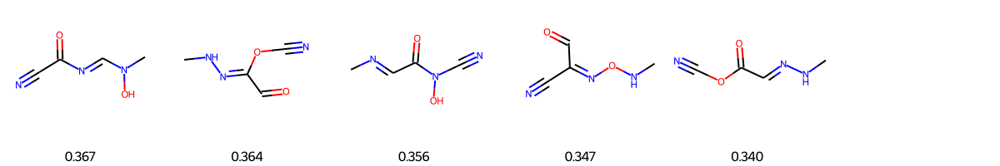

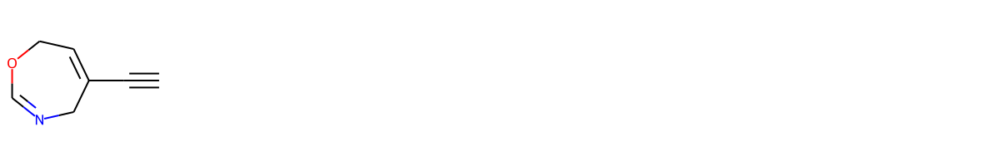

...

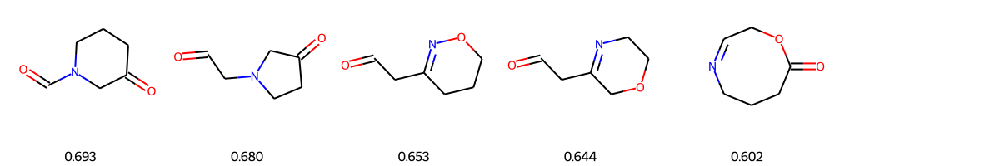

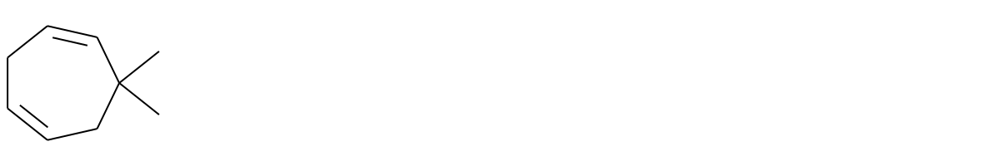

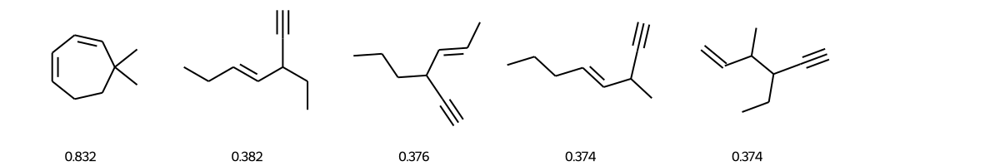

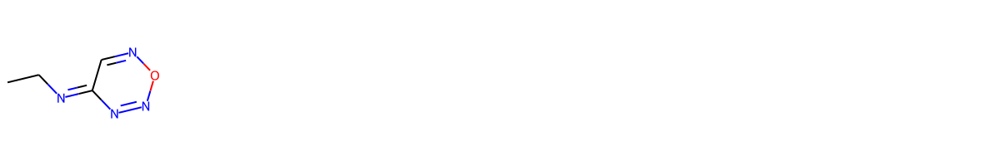

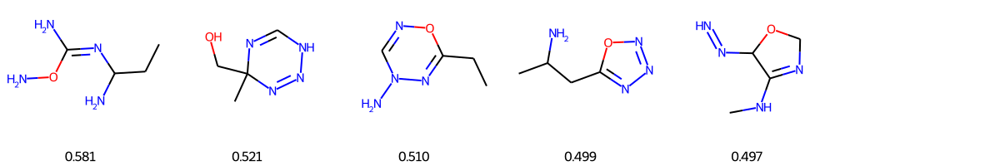

[91, 95, 181, 192, 235, 307, 312, 321, 336, 357, 359, 378, 434, 536, 627, 716, 853, 861, 867, 884, 901, 924, 956, 979, 980, 984, 1017, 1037, 1043, 1047, 1122, 1123, 1148, 1210, 1230, 1233, 1312, 1372, 1433, 1453, 1458, 1461, 1617, 1652, 1662, 1666, 1716, 1795, 1801, 1825, 1835, 1860, 1920, 1927, 1988, 2039, 2090, 2155, 2178, 2188, 2227, 2312, 2331, 2410, 2420, 2444, 2579, 2611, 2649, 2726, 2761, 2777, 2789, 2887, 2905, 2926, 2951, 2963, 3030, 3036, 3081, 3093, 3106, 3130, 3136, 3170, 3230, 3243, 3315, 3355, 3363, 3370, 3396, 3451, 3650, 3659, 3700, 3720, 3758, 3764, 3797, 3833, 3863, 3896, 3904, 3908, 3928, 3937, 3968, 3980, 3982, 4070, 4075, 4088, 4135, 4138, 4169, 4248, 4254, 4288, 4295, 4311, 4332, 4334, 4430, 4495, 4532, 4572, 4577, 4631, 4638, 4667, 4691, 4755, 4763, 4796, 4850, 4864, 4871]
Top 1 (%): 0.0
Top 3 (%): 0.0
Top 5 (%): 0.0
Top 10 (%): 0.0
Top 40 (%): 0.0
139 mols are done so far


In [18]:
wrong_rdkit_mols = list()

num_total = 0
num_top_1 = 0
num_top_3 = 0
num_top_5 = 0
num_top_10 = 0
num_top_40 = 0

top_n_similarities = [list() for i in range(5)]

for wrong_mol_num in wrong_mols_nums:
    
    filename = sriram_test_path + 'output_' + str(wrong_mol_num) + '.pkl'
    with open(filename, 'rb') as f: # open in readonly mode
        current_mol_log = pickle.load(f)
        
    mol_id = int(filename.split('_')[-1].split('.')[0])
    all_mols.append(mol_id)
    
    smiles_scores = dict()
    all_smiles = list()
    
    for episode_result in current_mol_log:
        reached_mol = Chem.CanonSmiles(episode_result[2][-1])
        all_smiles.append(reached_mol)
        smiles_scores[reached_mol] = episode_result[3]
    
    all_smiles = list(set(all_smiles))
    all_smiles = sorted(all_smiles, key=lambda x: smiles_scores[x], reverse=True)
    all_smiles_mols = [Chem.MolFromSmiles(x) for x in all_smiles]
    all_mols_rewards = [f"{smiles_scores[x]:.3f}" for x in all_smiles]
    
    target_mol = Chem.MolFromSmiles(target_smiles)
    all_smiles_legends = [
        "{:.3f}".format(rdkit.DataStructs.FingerprintSimilarity(
            rdMolDescriptors.GetMorganFingerprintAsBitVect(
        x, radius=3, nBits=2048, useChirality=0,
        useBondTypes=1, useFeatures=0),
            rdMolDescriptors.GetMorganFingerprintAsBitVect(
        target_mol, radius=3, nBits=2048, useChirality=0,
        useBondTypes=1, useFeatures=0)
        )) for x in all_smiles_mols
    ]
    
    num_total += 1
    
    target_smiles = Chem.CanonSmiles(current_mol_log[0][0])
    wrong_rdkit_mols.append(Chem.MolFromSmiles(target_smiles))
    
    if print_mols:
        print('Top hits for', target_smiles, filename.split('/')[-1])
    idx = 0
    while idx < len(all_smiles):
        hit = all_smiles[idx]
        
        if hit == target_smiles:
            if idx < 5 and print_mols:
                print('\t', idx, hit.ljust(20), str(smiles_scores[hit]), '<---')
            elif print_mols:
                print('\t', idx, hit.ljust(20), str(smiles_scores[hit]), 'vvv')
            if idx < 1:
                num_top_1 += 1
            if idx < 3:
                num_top_3 += 1
            if idx < 5:
                num_top_5 += 1
            if idx < 10:
                num_top_10 += 1
            if idx < 40:
                num_top_40 += 1
        elif idx < 5 and print_mols:
            print('\t', idx, hit.ljust(20), str(smiles_scores[hit]))

        idx += 1
        
    for idx, smiles in enumerate(all_smiles):
        if idx > 4:
            break
        top_n_similarities[idx].append(
            rdkit.DataStructs.FingerprintSimilarity(
                rdMolDescriptors.GetMorganFingerprintAsBitVect(
            Chem.MolFromSmiles(smiles)
                    , radius=3, nBits=2048, useChirality=0,
                    useBondTypes=1, useFeatures=0),
                rdMolDescriptors.GetMorganFingerprintAsBitVect(
            Chem.MolFromSmiles(target_smiles)
                    , radius=3, nBits=2048, useChirality=0,
                    useBondTypes=1, useFeatures=0)
            )
        )

    img = Chem.Draw.MolsToGridImage([Chem.MolFromSmiles(target_smiles)], molsPerRow=6, useSVG=True)
    display(img)
    with open('Images/tanimoto_mols/tanimoto_self_'+str(wrong_mol_num)+'.svg', 'w') as f_handle:
        f_handle.write(img.data)
    
    img = Chem.Draw.MolsToGridImage(all_smiles_mols[1:6], molsPerRow=6, legends=all_mols_rewards[1:6], useSVG=True)
    display(img)
    with open('Images/tanimoto_mols/tanimoto_mols_'+str(wrong_mol_num)+'.svg', 'w') as f_handle:
        f_handle.write(img.data)

print(wrong_mols_nums)

print('Top 1 (%):', 100.0* num_top_1/num_total)
print('Top 3 (%):', 100.0* num_top_3/num_total)
print('Top 5 (%):', 100.0* num_top_5/num_total)
print('Top 10 (%):', 100.0* num_top_10/num_total)
print('Top 40 (%):', 100.0* num_top_40/num_total)
print(num_total, 'mols are done so far')

# img = Chem.Draw.MolsToGridImage(wrong_rdkit_mols, molsPerRow=5, useSVG=True)
# display(img)

In [19]:
for sims in top_n_similarities:
    print(np.mean(sims), len(sims))

0.2280756008046351 139
0.19121941602656822 139
0.16659556239839138 138
0.16709345127204422 138
0.14849467984816317 138


In [69]:
cor_incor_rewards = pd.DataFrame(columns = ['Reward', 'Prediction'])


print_mols = False

num_total = 0
num_top_1 = 0
num_top_3 = 0
num_top_5 = 0
num_top_10 = 0
num_top_40 = 0

all_mols = list()
correct_mols_rewards = list()
wrong_mols_rewards = list()

#for filename in os.listdir('/home2/sriram.devata/MCTS/irInverse/test/test_outputs'):
sriram_test_path = '/ssd_scratch/users/sriram.devata/test_outputs_test_400/'


all_files = os.listdir(sriram_test_path)
all_files = [sriram_test_path+x for x in all_files if ".pkl" in x]

all_files = sorted(all_files, key=lambda x:int(x.split('_')[-1].split('.')[0]))

for filename in all_files:
    with open(filename, 'rb') as f: # open in readonly mode
        current_mol_log = pickle.load(f)
        
    mol_id = int(filename.split('_')[-1].split('.')[0])
    all_mols.append(mol_id)
    
    smiles_scores = dict()
    all_smiles = list()
    
    for episode_result in current_mol_log:
        reached_mol = Chem.CanonSmiles(episode_result[2][-1])
        all_smiles.append(reached_mol)
        smiles_scores[reached_mol] = episode_result[3]
    
    all_smiles = list(set(all_smiles))
    all_smiles = sorted(all_smiles, key=lambda x: smiles_scores[x], reverse=True)
    
    num_total += 1
    
    target_smiles = Chem.CanonSmiles(current_mol_log[0][0])
    if print_mols:
        print('Top hits for', target_smiles, filename.split('/')[-1])
    idx = 0
    
    if all_smiles[0] == target_smiles:
        correct_mols_rewards.append(smiles_scores[target_smiles])
        # cor_incor_rewards = cor_incor_rewards.append({'Reward': float(smiles_scores[target_smiles]), 'Prediction': "Correct"}, 
        #         ignore_index = True)
        prediction_string = "Correct"
    else:
        wrong_mols_rewards.append(smiles_scores[all_smiles[idx]])
        # cor_incor_rewards = cor_incor_rewards.append({'Reward': float(smiles_scores[all_smiles[idx]]), 'Prediction': "Incorrect"}, 
        #         ignore_index = True)
        prediction_string = "Incorrect"

    try:
        cor_incor_rewards = pd.concat([cor_incor_rewards, pd.DataFrame.from_dict({'Reward': [float(smiles_scores[target_smiles])], 'Prediction': [prediction_string]})], ignore_index=True)
    except:
        pass

    
print(cor_incor_rewards)

        Reward Prediction
0     0.988339    Correct
1     0.961913    Correct
2     0.988108    Correct
3     0.991349    Correct
4     0.989700    Correct
...        ...        ...
9174  0.989535    Correct
9175  0.987332    Correct
9176  0.986003    Correct
9177  0.989969    Correct
9178  0.989075    Correct

[9179 rows x 2 columns]


In [71]:
print("Total Incorrect", cor_incor_rewards.loc[cor_incor_rewards['Prediction'] == "Incorrect"].shape)
print("Total Correct", cor_incor_rewards.loc[cor_incor_rewards['Prediction'] == "Correct"].shape)
print("Correct and reward >= 0.95", cor_incor_rewards.loc[cor_incor_rewards['Prediction'] == "Correct"].loc[cor_incor_rewards['Reward'] >= 0.95].shape)
print("Incorrect and reward >= 0.95", cor_incor_rewards.loc[cor_incor_rewards['Prediction'] == "Incorrect"].loc[cor_incor_rewards['Reward'] >= 0.95].shape)

print(np.mean(list(cor_incor_rewards.loc[cor_incor_rewards['Prediction'] == "Correct"]["Reward"])))
print(np.mean(list(cor_incor_rewards.loc[cor_incor_rewards['Prediction'] == "Incorrect"]["Reward"])))

Total Incorrect (78, 2)
Total Correct (9101, 2)
Correct and reward >= 0.95 (8060, 2)
Incorrect and reward >= 0.95 (7, 2)
0.9757431547022627
0.8080161779304486


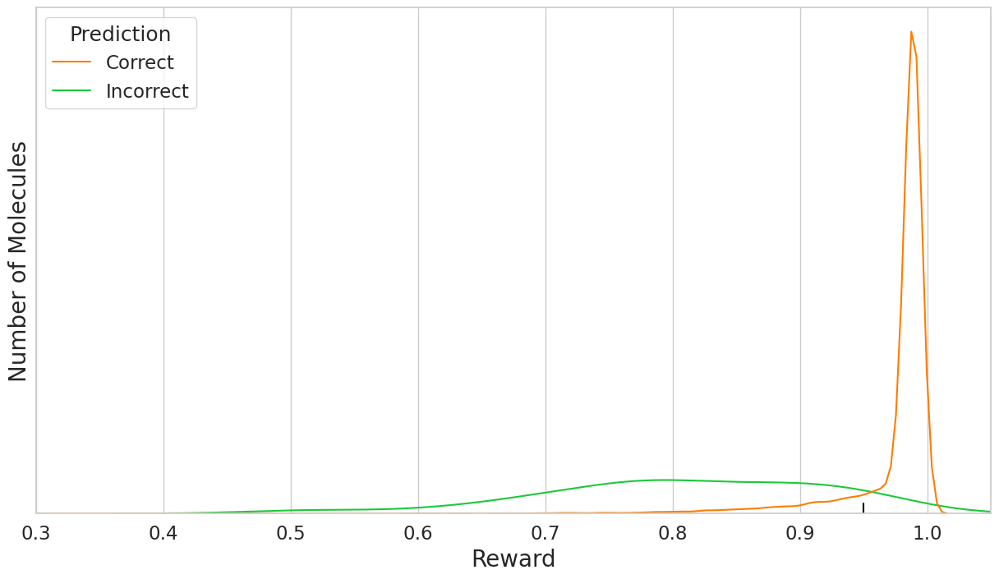

In [16]:
plt.figure(figsize=(15,8))

with sns.axes_style("whitegrid"):
    
    ax = sns.kdeplot(data=cor_incor_rewards, x='Reward', hue='Prediction', fill=False, common_norm=False,
                     palette=sns.color_palette('bright')[1:3])
    ax.set(yticks=[])

# ax.set(title="Histogram of time taken for IR-and-NMR-trained, IR-trained, and NMR-trained models")
# ax.set(xlabel='Time Taken (s)', ylabel='Number of Molecules')

sns.set(font_scale = 1.3)
plt.xlim(0.3, 1.05)


plt.axvline(0.95, 0, 0.02, color='black')

plt.xlabel("Reward", fontsize = 20)
plt.ylabel("Number of Molecules", fontsize = 20)
plt.grid(axis="y")

# plt.savefig('Images/cor_incor_rewards.svg', dpi=300)
plt.show()


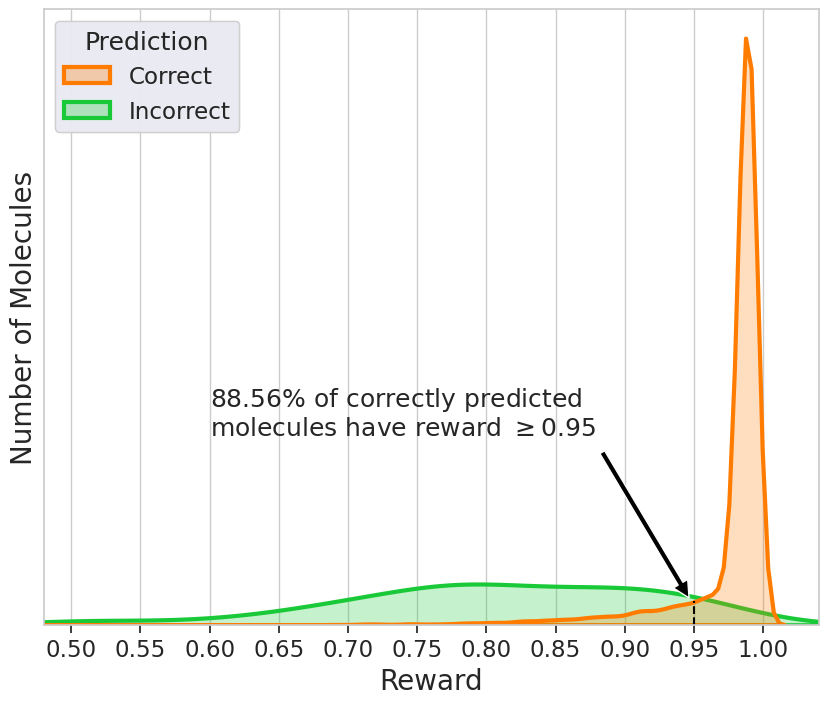

In [18]:
from matplotlib.legend_handler import HandlerTuple

fig = plt.figure(figsize=(10,8))

input_labels = ["Correct", "Incorrect"]

kde_plots = list()
kde_labels = list()
mean_lines = list()
with sns.axes_style("whitegrid"):
    kde = sns.kdeplot(data=cor_incor_rewards, x='Reward', hue='Prediction', fill=True, common_norm=False, palette=sns.color_palette('bright')[1:3], linewidth=3)    
    old_legend = kde.legend_
    kde_plots = old_legend.legendHandles
    kde_labels = [t.get_text() for t in old_legend.get_texts()]


sns.set(font_scale = 1.5)

plt.tick_params(left = False, right = False , labelleft = False , labelbottom = True, bottom = True)

ax = plt.gca()
ax.set_xticks(np.arange(0,1.1,0.05))

ninety_fifth_percentile = plt.axvline(0.95, 0, 0.04, color='black', ls="--")
ax.annotate('$88.56\%$ of correctly predicted \nmolecules have reward $\geq 0.95$', xy=(0.95, 1.5), xytext=(0.6, 15),
            # arrowprops=dict(color='black',arrowstyle="->", connectionstyle="arc3"),
            arrowprops=dict(facecolor='black', shrink=0.05),
            xycoords='data'
            )

plt.xlim(0.48, 1.04)
plt.xlabel("Reward", fontsize = 20)
plt.ylabel("Number of Molecules", fontsize = 20)
plt.grid(axis="y")

old_legend = plt.legend(handles=kde_plots, labels=kde_labels, loc=2, title="Prediction")
plt.gca().add_artist(old_legend)

# plt.savefig('Images/cor_incor_rewards.svg', dpi=300)
plt.show()

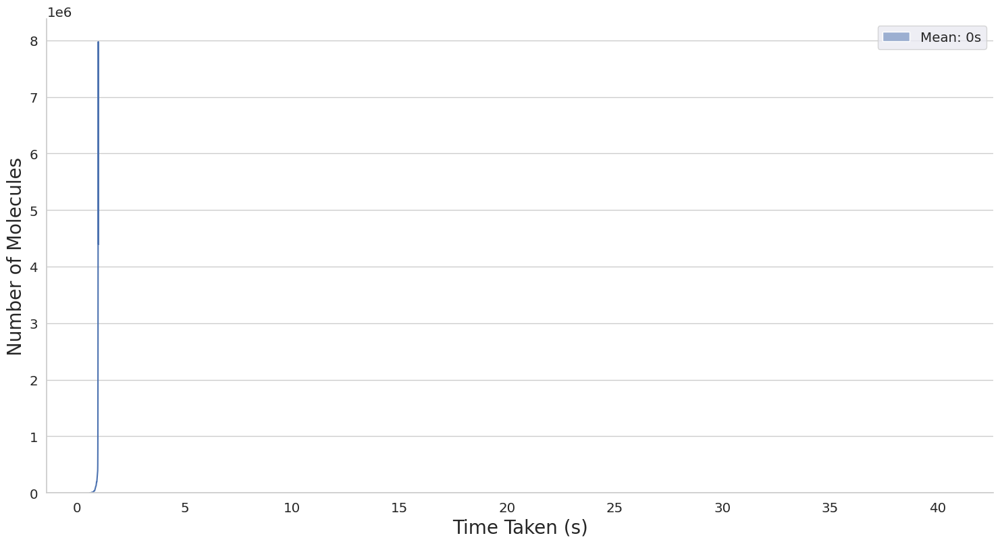

In [24]:
with sns.axes_style("whitegrid"):
    ax = sns.displot(correct_mols_rewards, 
             binwidth=40, 
            kde=True,
            stat='count',
            height=8, aspect=15/8,
                label=f"Mean: {int(np.mean(correct_mols_rewards))}s")

    
# ax.set(title="Histogram of time taken for each molecule")
# ax.set(xlabel='Time Taken (s)', ylabel='Number of Molecules', fontsize = 20)

sns.set(font_scale = 1.3)

plt.xlabel("Time Taken (s)", fontsize = 20)
plt.ylabel("Number of Molecules", fontsize = 20)
plt.grid(axis="x")
plt.legend()


# plt.savefig('Images/time_taken.svg', dpi=300)
plt.show()

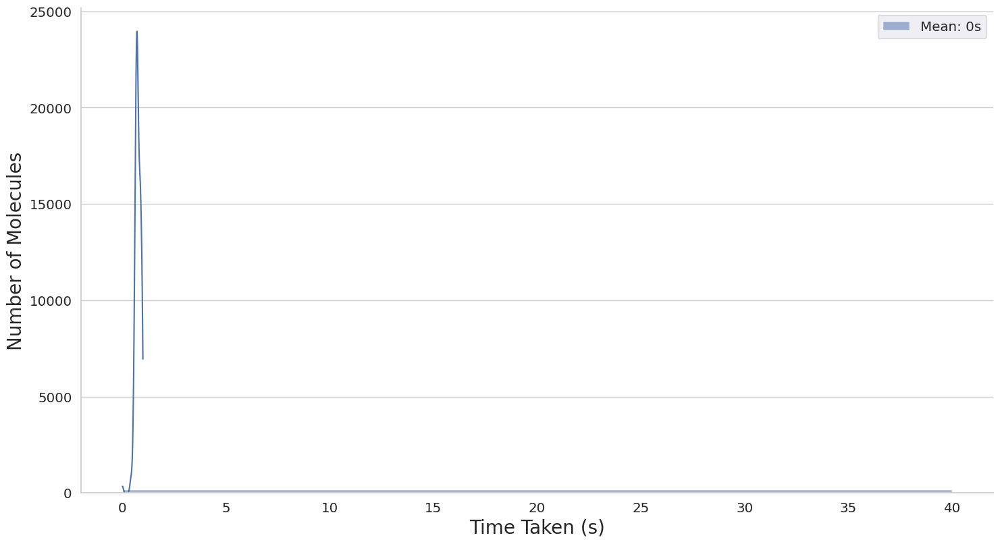

In [25]:
with sns.axes_style("whitegrid"):
    ax = sns.displot(wrong_mols_rewards, 
             binwidth=40, 
            kde=True,
            stat='count',
            height=8, aspect=15/8,
                label=f"Mean: {int(np.mean(wrong_mols_rewards))}s")

    
# ax.set(title="Histogram of time taken for each molecule")
# ax.set(xlabel='Time Taken (s)', ylabel='Number of Molecules', fontsize = 20)

sns.set(font_scale = 1.3)

plt.xlabel("Time Taken (s)", fontsize = 20)
plt.ylabel("Number of Molecules", fontsize = 20)
plt.grid(axis="x")
plt.legend()


# plt.savefig('Images/time_taken.svg', dpi=300)
plt.show()

In [49]:
sriram_test_path = '/ssd_scratch/users/sriram.devata/test_outputs_val_400/'

all_files = os.listdir(sriram_test_path)
all_files = [sriram_test_path+x for x in all_files if ".pkl" in x]
all_files = sorted(all_files, key=lambda x:int(x.split('_')[-1].split('.')[0]))

num_episodes = list()

for filename in all_files:
    with open(filename, 'rb') as f: # open in readonly mode
        current_mol_log = pickle.load(f)
        
    target_smiles = current_mol_log[0][0]
    
    time_taken = list()
    num_episode = 1
    for episode_log in current_mol_log:
        if target_smiles != Chem.CanonSmiles(episode_log[2][-1]):
            num_episode += 1
        else:
            break

    if num_episode != 33:
        num_episodes.append(num_episode)


In [50]:
sns.set(style="whitegrid")
sns.set_style("whitegrid")
sns.set(rc={'figure.figsize':(15,8)})

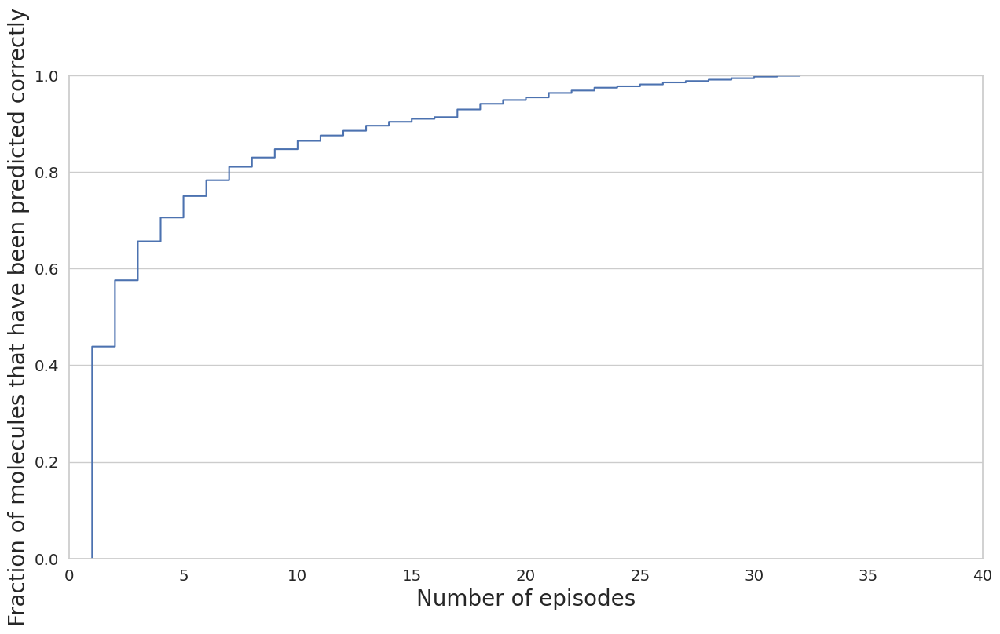

In [66]:
fig = plt.figure(figsize=(15,8))

# sns.kdeplot(all_times, fill=True, color='g')
# sns.histplot(all_times, 
#              binwidth=30, 
#             stat='count')


# with sns.axes_style("whitegrid"):
#     ax = sns.displot(all_times, 
#              binwidth=40, 
#             kde=True,
#             stat='count',
#             height=8, aspect=15/8,
#                 label=f"Mean: {int(np.mean(all_times))}s")

with sns.axes_style("whitegrid"):
#     ax = sns.displot(num_episodes, 
#             kind="hist",
#             kde=True,
#             aspect=15/8,
#             line_kws={'linewidth': 3},
#             binwidth=1)
    ax = sns.ecdfplot(num_episodes)

    
# with sns.axes_style("whitegrid"):
#     ax = sns.distplot(all_times, 
#                       kde_kws=dict(linewidth=5),
#                 label=f"Mean: {int(np.mean(all_times))}s")

    
# ax.set(title="Histogram of time taken for each molecule")
# ax.set(xlabel='Time Taken (s)', ylabel='Number of Molecules', fontsize = 20)

sns.set(font_scale = 1.3)
plt.xlim(0, 40)


plt.xlabel("Number of episodes", fontsize = 20)
plt.ylabel("Fraction of molecules that have been predicted correctly", fontsize = 20)
plt.grid(axis="x")


plt.savefig('Images/num_episodes.svg', dpi=300, bbox_inches = "tight")
plt.show()

In [58]:
cumulative_counts = [0] * 40
for each_num_episode in num_episodes:
    cumulative_counts[each_num_episode] += 1

cumulative_counts = [x/len(num_episodes)*100 for x in cumulative_counts]

cum = 0
for i, each_cumulative in enumerate(cumulative_counts):
    cum += each_cumulative
    print(i, each_cumulative, cum)

0 0.0 0.0
1 43.865765962083245 43.865765962083245
2 13.706689910655918 57.57245587273916
3 8.06275877097407 65.63521464371323
4 4.924820222270647 70.56003486598388
5 4.445412943996514 75.0054478099804
6 3.268685988232731 78.27413379821313
7 2.7892787099585967 81.06341250817172
8 1.917629113096535 82.98104162126826
9 1.7215079538025713 84.70254957507083
10 1.7215079538025713 86.4240575288734
11 1.1113532359991285 87.53541076487254
12 0.9806057964698192 88.51601656134235
13 1.0459795162344738 89.56199607757682
14 0.8062758770974069 90.36827195467423
15 0.610154717803443 90.97842667247767
16 0.3486598387448246 91.32708651122249
17 1.5907605142732621 92.91784702549575
18 1.176726955763783 94.09457398125953
19 0.7844846371758554 94.87905861843538
20 0.5447809980387884 95.42383961647417
21 0.9152320767051645 96.33907169317933
22 0.5011985181956853 96.84027021137501
23 0.5883634778818915 97.4286336892569
24 0.28328611898017 97.71191980823707
25 0.3922423185879277 98.104162126825
26 0.41403355

In [30]:
sriram_test_path = '/ssd_scratch/users/sriram.devata/test_outputs_test_400/'

all_files = os.listdir(sriram_test_path)
all_files = [sriram_test_path+x for x in all_files if ".pkl" in x]
all_files = sorted(all_files, key=lambda x:int(x.split('_')[-1].split('.')[0]))

all_tanimoto = list()

for filename in all_files:
    with open(filename, 'rb') as f: # open in readonly mode
        current_mol_log = pickle.load(f)
        
    target_smiles = current_mol_log[0][0]
            
    best_reward = 0
    best_smiles = None
    for episode_log in current_mol_log:
        if episode_log[-2] > best_reward:
            best_reward = episode_log[-2]
            best_smiles = Chem.CanonSmiles(episode_log[2][-1])

    
    target_mol = Chem.MolFromSmiles(target_smiles)
    best_mol = Chem.MolFromSmiles(best_smiles)
    
    from rdkit.Chem.Fingerprints import FingerprintMols
    target_fp = FingerprintMols.FingerprintMol(target_mol)
    best_fp = FingerprintMols.FingerprintMol(best_mol)
    
    from rdkit import DataStructs
    
    tan_sim = DataStructs.TanimotoSimilarity(target_fp, best_fp)
        
    all_tanimoto.append(tan_sim)
    
print("Average tanimoto:", sum(all_tanimoto)/len(all_tanimoto))

Average tanimoto: 0.9542298471716135


In [25]:
! unzip -d /ssd_scratch/users/sriram.devata/ /home2/sriram.devata/Results_DeepSPInN/test_outputs_small_train_big_test.zip

Archive:  /home2/sriram.devata/Results_DeepSPInN/test_outputs_small_train_big_test.zip
   creating: /ssd_scratch/users/sriram.devata/test_outputs_small_train_big_test/
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_small_train_big_test/output_2086.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_small_train_big_test/output_4946.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_small_train_big_test/output_621.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_small_train_big_test/output_474.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_small_train_big_test/output_1323.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_small_train_big_test/output_4842.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_small_train_big_test/output_2456.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_small_train_big_test/output_2488.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test

  inflating: /ssd_scratch/users/sriram.devata/test_outputs_small_train_big_test/output_4644.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_small_train_big_test/output_2626.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_small_train_big_test/output_1314.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_small_train_big_test/output_1658.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_small_train_big_test/output_2141.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_small_train_big_test/output_1638.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_small_train_big_test/output_92.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_small_train_big_test/output_1453.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_small_train_big_test/output_2449.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_small_train_big_test/output_4881.pkl  
  inflating: /ssd_scra

  inflating: /ssd_scratch/users/sriram.devata/test_outputs_small_train_big_test/output_905.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_small_train_big_test/output_620.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_small_train_big_test/output_4636.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_small_train_big_test/output_1420.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_small_train_big_test/output_3990.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_small_train_big_test/output_897.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_small_train_big_test/output_3143.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_small_train_big_test/output_1496.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_small_train_big_test/output_1347.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_small_train_big_test/output_1130.pkl  
  inflating: /ssd_scrat

  inflating: /ssd_scratch/users/sriram.devata/test_outputs_small_train_big_test/output_4072.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_small_train_big_test/output_1179.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_small_train_big_test/output_1592.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_small_train_big_test/output_4557.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_small_train_big_test/output_3782.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_small_train_big_test/output_1955.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_small_train_big_test/output_4146.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_small_train_big_test/output_2775.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_small_train_big_test/output_2846.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_small_train_big_test/output_749.pkl  
  inflating: /ssd_scr

  inflating: /ssd_scratch/users/sriram.devata/test_outputs_small_train_big_test/output_1459.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_small_train_big_test/output_1736.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_small_train_big_test/output_4914.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_small_train_big_test/output_414.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_small_train_big_test/output_2451.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_small_train_big_test/output_2359.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_small_train_big_test/output_1604.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_small_train_big_test/output_4645.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_small_train_big_test/output_1596.pkl  
  inflating: /ssd_scratch/users/sriram.devata/test_outputs_small_train_big_test/output_2524.pkl  
  inflating: /ssd_scr

In [26]:
import os
import sys
import pickle
import numpy as np
from rdkit import Chem

from tqdm import tqdm

for required_num_atoms in [8,9]:
    
    print_mols = False

    num_total = 0
    num_top_1 = 0
    num_top_3 = 0
    num_top_5 = 0
    num_top_10 = 0
    num_top_40 = 0

    all_mols = list()
    wrong_mols = list()
    wrong_mols_nums = list()

    #for filename in os.listdir('~/DeepSPInN/test/test_outputs'):
    test_path = '/ssd_scratch/users/sriram.devata/test_outputs_small_train_big_test/'
    all_files = os.listdir(test_path)
    all_files = [test_path+x for x in all_files if 'output' in x]

    all_files = sorted(all_files, key=lambda x:int(x.split('_')[-1].split('.')[0]))

    for filename in tqdm(all_files):
        # with open(os.path.join('~/DeepSPInN/test/test_outputs', filename), 'rb') as f: # open in readonly mode
        try:
            with open(filename, 'rb') as f: # open in readonly mode
                current_mol_log = pickle.load(f)
        except Exception as e:
            print(filename, e)
            continue

        mol_id = int(filename.split('_')[-1].split('.')[0])
        all_mols.append(mol_id)

        smiles_scores = dict()
        all_smiles = list()

        for episode_result in current_mol_log:
            reached_mol = Chem.CanonSmiles(episode_result[2][-1])
            all_smiles.append(reached_mol)
            smiles_scores[reached_mol] = episode_result[3]

        all_smiles = list(set(all_smiles))
        all_smiles = sorted(all_smiles, key=lambda x: smiles_scores[x], reverse=True)


        target_smiles = Chem.CanonSmiles(current_mol_log[0][0])
        
        if Chem.MolFromSmiles(target_smiles).GetNumAtoms() != required_num_atoms:
            continue
        
        num_total += 1
        
        if print_mols:
            print('Top hits for', target_smiles, filename.split('/')[-1])
        idx = 0
        while idx < len(all_smiles):
            hit = all_smiles[idx]

            if hit == target_smiles:
                if idx < 5 and print_mols:
                    print('\t', idx, hit.ljust(20), str(smiles_scores[hit]), '<---')
                elif print_mols:
                    print('\t', idx, hit.ljust(20), str(smiles_scores[hit]), 'vvv')
                if idx < 1:
                    num_top_1 += 1
                if idx < 3:
                    num_top_3 += 1
                if idx < 5:
                    num_top_5 += 1
                if idx < 10:
                    num_top_10 += 1
                if idx < 40:
                    num_top_40 += 1
            elif idx < 5 and print_mols:
                print('\t', idx, hit.ljust(20), str(smiles_scores[hit]))

            idx += 1

        if target_smiles not in all_smiles:
            wrong_mols.append(target_smiles)
            wrong_mols_nums.append(int(filename.split('_')[-1].split('.')[0]))
            if print_mols:
                print('Paste in cheminfo:')
                print(target_smiles, current_mol_log[0][1])
                print('\n'.join(all_smiles[:5]))

    if print_mols:
        print('Wrong mols', wrong_mols)
        print(wrong_mols_nums)

    print(f"Number of atoms: {required_num_atoms}")
    print('Top 1 (%):', 100.0* num_top_1/num_total)
    print('Top 3 (%):', 100.0* num_top_3/num_total)
    print('Top 5 (%):', 100.0* num_top_5/num_total)
    print('Top 10 (%):', 100.0* num_top_10/num_total)
    print('Top 40 (%):', 100.0* num_top_40/num_total)
    print(num_total, 'mols are done so far')

    print('\n\nRanges done so far:')
    all_mols = sorted(list(set(all_mols)))
    for idx,num in enumerate(all_mols):
        if idx == 0:
            print(f'{num} - ', end='')
        elif num - all_mols[idx-1] != 1:
            print(f'{all_mols[idx-1]}\n{num} - ', end='')
        elif idx == len(all_mols)-1:
            print(f'{num}')


100%|██████████| 5000/5000 [00:05<00:00, 895.74it/s] 


Number of atoms: 8
Top 1 (%): 89.88326848249027
Top 3 (%): 90.14267185473412
Top 5 (%): 90.27237354085604
Top 10 (%): 90.27237354085604
Top 40 (%): 90.27237354085604
771 mols are done so far


Ranges done so far:
0 - 4999


100%|██████████| 5000/5000 [00:05<00:00, 985.31it/s] 

Number of atoms: 9
Top 1 (%): 64.6252069047056
Top 3 (%): 65.05083944194845
Top 5 (%): 65.1217781981556
Top 10 (%): 65.19271695436274
Top 40 (%): 65.19271695436274
4229 mols are done so far


Ranges done so far:
0 - 4999


In [4]:
import os
import sys
import pickle
import numpy as np
from rdkit import Chem

from tqdm import tqdm

all_functional_groups = ["[#6][OX2H]", "[CX3H1](=O)[#6]", "[NX3;H2,H1;!$(NC=O)]", "[OX2H][CX3]=[OX1]", "[#6][CX3](=O)[OX2H0][#6]", "[#6][CX3](=O)[#6]", "[OX2H][cX3]:[c]"]
all_functional_groups_names = ["alcohols", "aldehyde", "primary or secondary amine", "carboxylic acid", "ester", "ketone", "phenol"]

for func_name, functional_group_smarts in zip(all_functional_groups_names, all_functional_groups):
    
    print_mols = False

    num_total = 0
    num_top_1 = 0
    num_top_3 = 0
    num_top_5 = 0
    num_top_10 = 0
    num_top_40 = 0
    num_atoms_in_mol = list()

    all_mols = list()
    wrong_mols = list()
    wrong_mols_nums = list()

    #for filename in os.listdir('~/DeepSPInN/test/test_outputs'):
    test_path = '/ssd_scratch/users/sriram.devata/test_outputs_test_400/'
    all_files = os.listdir(test_path)
    all_files = [test_path+x for x in all_files if 'output' in x]

    all_files = sorted(all_files, key=lambda x:int(x.split('_')[-1].split('.')[0]))

    for filename in tqdm(all_files):
        # with open(os.path.join('~/DeepSPInN/test/test_outputs', filename), 'rb') as f: # open in readonly mode
        try:
            with open(filename, 'rb') as f: # open in readonly mode
                current_mol_log = pickle.load(f)
        except Exception as e:
            print(filename, e)
            continue

        mol_id = int(filename.split('_')[-1].split('.')[0])
        all_mols.append(mol_id)

        smiles_scores = dict()
        all_smiles = list()

        for episode_result in current_mol_log:
            reached_mol = Chem.CanonSmiles(episode_result[2][-1])
            all_smiles.append(reached_mol)
            smiles_scores[reached_mol] = episode_result[3]

        all_smiles = list(set(all_smiles))
        all_smiles = sorted(all_smiles, key=lambda x: smiles_scores[x], reverse=True)


        target_smiles = Chem.CanonSmiles(current_mol_log[0][0])
        

        target_mol = Chem.MolFromSmiles(target_smiles)
        functional_group = Chem.MolFromSmarts(functional_group_smarts)
        matches = target_mol.GetSubstructMatches(functional_group)
        if len(matches) == 0:
            continue
            
        num_atoms_in_mol.append(target_mol.GetNumAtoms())
        
        num_total += 1
        
        if print_mols:
            print('Top hits for', target_smiles, filename.split('/')[-1])
        idx = 0
        while idx < len(all_smiles):
            hit = all_smiles[idx]

            if hit == target_smiles:
                if idx < 5 and print_mols:
                    print('\t', idx, hit.ljust(20), str(smiles_scores[hit]), '<---')
                elif print_mols:
                    print('\t', idx, hit.ljust(20), str(smiles_scores[hit]), 'vvv')
                if idx < 1:
                    num_top_1 += 1
                if idx < 3:
                    num_top_3 += 1
                if idx < 5:
                    num_top_5 += 1
                if idx < 10:
                    num_top_10 += 1
                if idx < 40:
                    num_top_40 += 1
            elif idx < 5 and print_mols:
                print('\t', idx, hit.ljust(20), str(smiles_scores[hit]))

            idx += 1

        if target_smiles not in all_smiles:
            wrong_mols.append(target_smiles)
            wrong_mols_nums.append(int(filename.split('_')[-1].split('.')[0]))
            if print_mols:
                print('Paste in cheminfo:')
                print(target_smiles, current_mol_log[0][1])
                print('\n'.join(all_smiles[:5]))

    if num_total == 0 :
        continue
                
    if print_mols:
        print('Wrong mols', wrong_mols)
        print(wrong_mols_nums)

    num_atoms_in_mol = sum(num_atoms_in_mol)/len(num_atoms_in_mol)
        
    print(f"Functional Group: {func_name} (Avg Atoms: {num_atoms_in_mol})")
    print('Top 1 (%):', 100.0* num_top_1/num_total)
    print('Top 3 (%):', 100.0* num_top_3/num_total)
    print('Top 5 (%):', 100.0* num_top_5/num_total)
    print('Top 10 (%):', 100.0* num_top_10/num_total)
    print('Top 40 (%):', 100.0* num_top_40/num_total)
    print(num_total, 'mols are done so far')


100%|██████████| 9951/9951 [00:07<00:00, 1322.31it/s]


Functional Group: alcohols (Avg Atoms: 8.769333779712086)
Top 1 (%): 92.36692333444928
Top 3 (%): 93.33779712085705
Top 5 (%): 93.40475393371275
Top 10 (%): 93.43823234014062
Top 40 (%): 93.43823234014062
2987 mols are done so far


100%|██████████| 9951/9951 [00:07<00:00, 1314.26it/s]


Functional Group: aldehyde (Avg Atoms: 8.766886326194399)
Top 1 (%): 93.49258649093905
Top 3 (%): 94.48105436573312
Top 5 (%): 94.64579901153212
Top 10 (%): 94.64579901153212
Top 40 (%): 94.64579901153212
1214 mols are done so far


100%|██████████| 9951/9951 [00:07<00:00, 1323.69it/s]


Functional Group: primary or secondary amine (Avg Atoms: 8.797781139687343)
Top 1 (%): 86.9894099848714
Top 3 (%): 87.5945537065053
Top 5 (%): 87.64498234997478
Top 10 (%): 87.69541099344427
Top 40 (%): 87.69541099344427
1983 mols are done so far


100%|██████████| 9951/9951 [00:07<00:00, 1316.85it/s]


Functional Group: ester (Avg Atoms: 8.784897025171624)
Top 1 (%): 93.82151029748283
Top 3 (%): 94.50800915331808
Top 5 (%): 94.50800915331808
Top 10 (%): 94.50800915331808
Top 40 (%): 94.50800915331808
437 mols are done so far


100%|██████████| 9951/9951 [00:06<00:00, 1578.56it/s]


Functional Group: ketone (Avg Atoms: 8.796052631578947)
Top 1 (%): 96.2406015037594
Top 3 (%): 97.27443609022556
Top 5 (%): 97.36842105263158
Top 10 (%): 97.36842105263158
Top 40 (%): 97.36842105263158
1064 mols are done so far


100%|██████████| 9951/9951 [00:06<00:00, 1556.65it/s]

Functional Group: phenol (Avg Atoms: 8.780575539568344)
Top 1 (%): 90.8273381294964
Top 3 (%): 91.00719424460432
Top 5 (%): 91.00719424460432
Top 10 (%): 91.00719424460432
Top 40 (%): 91.00719424460432
556 mols are done so far


In [31]:
with open('/home2/sriram.devata/DeepSPInN/data/qm9_train_test_val_ir_nmr.pickle', 'rb') as handle:
    ir_all_datasets = pickle.load(handle)
all_datapoints = ir_all_datasets["train"] + ir_all_datasets["val"] + ir_all_datasets["test"]

In [68]:
from rdkit.Chem import Descriptors
from collections import defaultdict 

all_mol_wts = list()
atomic_count = defaultdict(lambda : 0)

for each_datapoint in all_datapoints:
    
    each_mol = Chem.MolFromSmiles(each_datapoint[0])
    
    mol_wt = Descriptors.MolWt(each_mol)
    all_mol_wts.append(mol_wt)
    
    atom_type_counted = defaultdict(lambda : False)
    
    for each_atom in each_mol.GetAtoms():
        if not atom_type_counted[each_atom.GetAtomicNum()]:
            atomic_count[each_atom.GetAtomicNum()] += 1
            atom_type_counted[each_atom.GetAtomicNum()] = True

print(atomic_count)

defaultdict(<function <lambda> at 0x151067ad2040>, {7: 35609, 6: 49749, 8: 42722, 9: 1749})


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<Figure size 1500x800 with 0 Axes>

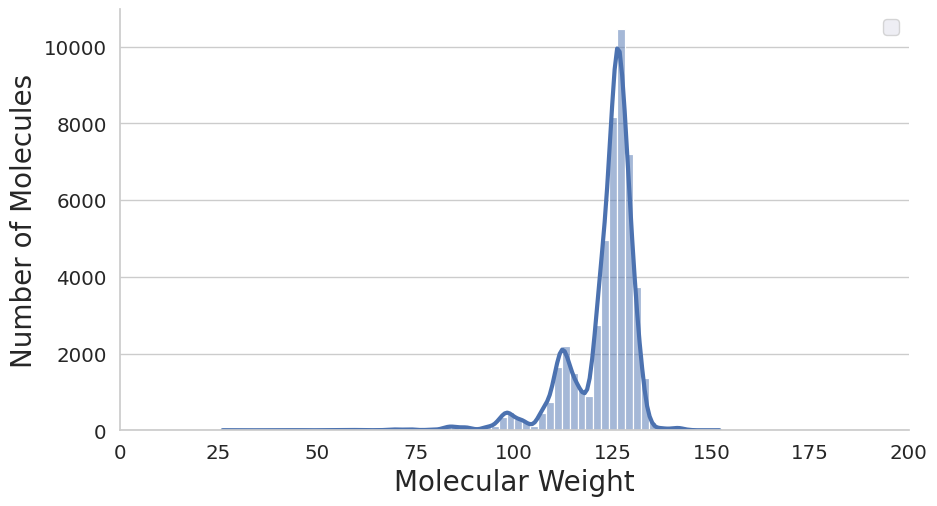

In [69]:
fig = plt.figure(figsize=(15,8))


with sns.axes_style("whitegrid"):
    ax = sns.displot(all_mol_wts, 
            kind="hist",
            kde=True,
            aspect=15/8,
            line_kws={'linewidth': 3},
            binwidth=2)


sns.set(font_scale = 1.3)
plt.xlim(0, 200)


plt.xlabel("Molecular Weight", fontsize = 20)
plt.ylabel("Number of Molecules", fontsize = 20)
plt.grid(axis="x")
plt.legend()


# plt.savefig('Images/mol_wt_distribution.svg', dpi=300, bbox_inches = "tight")
plt.show()

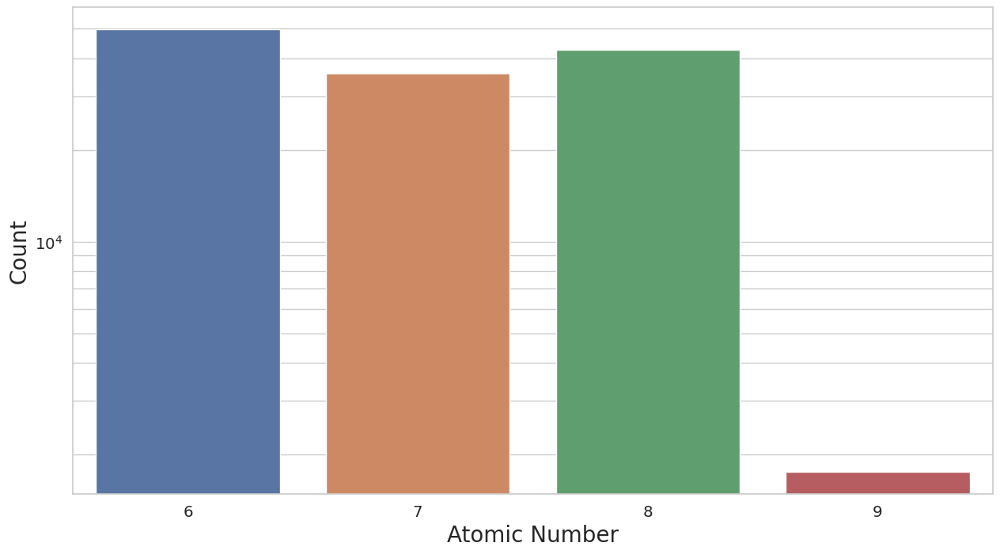

In [71]:
keys = list(atomic_count.keys())
# get values in the same order as keys, and parse percentage values
vals = [float(atomic_count[k]) for k in keys]
# sns.barplot(x=keys, y=vals)


fig = plt.figure(figsize=(15,8))


with sns.axes_style("whitegrid"):
    ax = sns.barplot(x=keys, y=vals)

sns.set(font_scale = 1.3)

ax.set_yscale('log')

ax.grid(True, which="minor", axis='y', ls="-")

plt.xlabel("Atomic Number", fontsize = 20)
plt.ylabel("Count", fontsize = 20)
# plt.grid(axis="x")
# plt.legend()


# plt.savefig('Images/atom_counts_dist.svg', dpi=300, bbox_inches = "tight")
plt.show()

In [102]:
from jcamp import jcamp_calc_xsec, jcamp_readfile

nist_ir_dataset = [
    ("InChI=1S/C6H6/c1-2-4-6-5-3-1/h1-6H", "https://webbook.nist.gov/cgi/cbook.cgi?JCAMP=C71432&Index=4&Type=IR"),
    ("InChI=1S/C2H4/c1-2/h1-2H2", "https://webbook.nist.gov/cgi/cbook.cgi?JCAMP=C74851&Index=2&Type=IR"),
    ("InChI=1S/C3H6O/c1-3(2)4/h1-2H3", "https://webbook.nist.gov/cgi/cbook.cgi?JCAMP=C67641&Index=6&Type=IR"),
    ("InChI=1S/C2H6O/c1-2-3/h3H,2H2,1H3", "https://webbook.nist.gov/cgi/cbook.cgi?JCAMP=C64175&Index=5&Type=IR"),
    ("InChI=1S/CH4O/c1-2/h2H,1H3", "https://webbook.nist.gov/cgi/cbook.cgi?JCAMP=C67561&Index=4&Type=IR"),
("InChI=1S/C3H8O/c1-3(2)4/h3-4H,1-2H3", "https://webbook.nist.gov/cgi/cbook.cgi?JCAMP=C67630&Index=5&Type=IR"),
("InChI=1S/C4H8O2/c1-3-6-4(2)5/h3H2,1-2H3", "https://webbook.nist.gov/cgi/cbook.cgi?JCAMP=C141786&Index=4&Type=IR"),
("InChI=1S/C4H10O/c1-2-3-4-5/h5H,2-4H2,1H3", "https://webbook.nist.gov/cgi/cbook.cgi?JCAMP=C71363&Index=5&Type=IR"),
("InChI=1S/F6S/c1-7(2,3,4,5)6", "https://webbook.nist.gov/cgi/cbook.cgi?JCAMP=C2551624&Index=2&Type=IR"),
("InChI=1S/CF4/c2-1(3,4)5", "https://webbook.nist.gov/cgi/cbook.cgi?JCAMP=C75730&Index=3&Type=IR"),
("InChI=1S/CH3Br/c1-2/h1H3", "https://webbook.nist.gov/cgi/cbook.cgi?JCAMP=C74839&Index=3&Type=IR"),
("InChI=1S/C2H3N/c1-2-3/h1H3", "https://webbook.nist.gov/cgi/cbook.cgi?JCAMP=C75058&Index=4&Type=IR"),
("InChI=1S/C2H4O/c1-2-3-1/h1-2H2", "https://webbook.nist.gov/cgi/cbook.cgi?JCAMP=C75218&Index=2&Type=IR"),
("InChI=1S/C3H6O/c1-3-2-4-3/h3H,2H2,1H3", "https://webbook.nist.gov/cgi/cbook.cgi?JCAMP=C75569&Index=3&Type=IR"),
("InChI=1S/C4H8O/c1-3-4(2)5/h3H2,1-2H3", "https://webbook.nist.gov/cgi/cbook.cgi?JCAMP=C78933&Index=4&Type=IR"),
("InChI=1S/C6H14O/c1-5-7-6(2,3)4/h5H2,1-4H3", "https://webbook.nist.gov/cgi/cbook.cgi?JCAMP=C637923&Index=2&Type=IR"),
("InChI=1S/C4H6/c1-3-4-2/h3-4H,1-2H2", "https://webbook.nist.gov/cgi/cbook.cgi?JCAMP=C106990&Index=3&Type=IR"),
("InChI=1S/C3H3N/c1-2-3-4/h2H,1H2", "https://webbook.nist.gov/cgi/cbook.cgi?JCAMP=C107131&Index=3&Type=IR"),
("InChI=1S/C4H6O2/c1-3-6-4(2)5/h3H,1H2,2H3", "https://webbook.nist.gov/cgi/cbook.cgi?JCAMP=C108054&Index=4&Type=IR"),
("InChI=1S/C7H8/c1-7-5-3-2-4-6-7/h2-6H,1H3", "https://webbook.nist.gov/cgi/cbook.cgi?JCAMP=C108883&Index=5&Type=IR"),
("InChI=1S/C5H8O2/c1-3-5(6)7-4-2/h3H,1,4H2,2H3", "https://webbook.nist.gov/cgi/cbook.cgi?JCAMP=C140885&Index=4&Type=IR"),
("InChI=1S/C5H12O/c1-5(2,3)6-4/h1-4H3", "https://webbook.nist.gov/cgi/cbook.cgi?JCAMP=C1634044&Index=2&Type=IR"),
("InChI=1S/O2S/c1-3-2", "https://webbook.nist.gov/cgi/cbook.cgi?JCAMP=C7446095&Index=3&Type=IR"),
("InChI=1S/C2F6/c3-1(4,5)2(6,7)8", "https://webbook.nist.gov/cgi/cbook.cgi?JCAMP=C76164&Index=2&Type=IR"),
("InChI=1S/C2HF5/c3-1(4)2(5,6)7/h1H", "https://webbook.nist.gov/cgi/cbook.cgi?JCAMP=C354336&Index=1&Type=IR"),
("InChI=1S/CHCl3/c2-1(3)4/h1H", "https://webbook.nist.gov/cgi/cbook.cgi?JCAMP=C67663&Index=4&Type=IR"),
("InChI=1S/CCl4/c2-1(3,4)5", "https://webbook.nist.gov/cgi/cbook.cgi?JCAMP=C56235&Index=6&Type=IR"),
("InChI=1S/C2Cl4/c3-1(4)2(5)6", "https://webbook.nist.gov/cgi/cbook.cgi?JCAMP=C127184&Index=5&Type=IR"),
("InChI=1S/C4H10/c1-3-4-2/h3-4H2,1-2H3", "https://webbook.nist.gov/cgi/cbook.cgi?JCAMP=C106978&Index=3&Type=IR"),
("InChI=1S/C2HCl3/c3-1-2(4)5/h1H", "https://webbook.nist.gov/cgi/cbook.cgi?JCAMP=C79016&Index=5&Type=IR"),
("InChI=1S/C2H3Cl3/c3-1-2(4)5/h2H,1H2", "https://webbook.nist.gov/cgi/cbook.cgi?JCAMP=C79005&Index=4&Type=IR"),
("InChI=1S/C8H10/c1-7-5-3-4-6-8(7)2/h3-6H,1-2H3", "https://webbook.nist.gov/cgi/cbook.cgi?JCAMP=C95476&Index=4&Type=IR"),
("InChI=1S/C8H10/c1-7-4-3-5-8(2)6-7/h3-6H,1-2H3", "https://webbook.nist.gov/cgi/cbook.cgi?JCAMP=C108383&Index=5&Type=IR"),
("InChI=1S/C8H10/c1-7-3-5-8(2)6-4-7/h3-6H,1-2H3", "https://webbook.nist.gov/cgi/cbook.cgi?JCAMP=C106423&Index=6&Type=IR"),
("InChI=1S/C8H10/c1-2-8-6-4-3-5-7-8/h3-7H,2H2,1H3", "https://webbook.nist.gov/cgi/cbook.cgi?JCAMP=C100414&Index=5&Type=IR"),
("InChI=1S/C2H4Cl2/c3-1-2-4/h1-2H2", "https://webbook.nist.gov/cgi/cbook.cgi?JCAMP=C107062&Index=4&Type=IR"),
("InChI=1S/C2H3Cl3/c1-2(3,4)5/h1H3", "https://webbook.nist.gov/cgi/cbook.cgi?JCAMP=C71556&Index=4&Type=IR"),
("InChI=1S/CCl2F2/c2-1(3,4)5", "https://webbook.nist.gov/cgi/cbook.cgi?JCAMP=C75718&Index=3&Type=IR"),
("InChI=1S/CH2Cl2/c2-1-3/h1H2", "https://webbook.nist.gov/cgi/cbook.cgi?JCAMP=C75092&Index=4&Type=IR"),
("InChI=1S/C2H2Cl2/c1-2(3)4/h1H2", "https://webbook.nist.gov/cgi/cbook.cgi?JCAMP=C75354&Index=4&Type=IR"),
]

for idx in range(len(nist_ir_dataset)):
    os.system(f"wget \"{nist_ir_dataset[idx][1]}\" -O /ssd_scratch/users/sriram.devata/nist_ir_dataset/{idx}.jdx")

--2023-12-20 05:29:16--  https://webbook.nist.gov/cgi/cbook.cgi?JCAMP=C71432&Index=4&Type=IR
Resolving webbook.nist.gov (webbook.nist.gov)... 129.6.13.9, 2610:20:6b01:4::99
Connecting to webbook.nist.gov (webbook.nist.gov)|129.6.13.9|:443... connected.
HTTP request sent, awaiting response... 200 
Length: unspecified [chemical/x-jcamp-dx]
Saving to: ‘/ssd_scratch/users/sriram.devata/nist_ir_dataset/0.jdx’

     0K .......... .......... .......... .......... .......... 99.8K
    50K ....                                                   9464G=0.5s

2023-12-20 05:29:19 (110 KB/s) - ‘/ssd_scratch/users/sriram.devata/nist_ir_dataset/0.jdx’ saved [56281]

--2023-12-20 05:29:19--  https://webbook.nist.gov/cgi/cbook.cgi?JCAMP=C74851&Index=2&Type=IR
Resolving webbook.nist.gov (webbook.nist.gov)... 129.6.13.9, 2610:20:6b01:4::99
Connecting to webbook.nist.gov (webbook.nist.gov)|129.6.13.9|:443... connected.
HTTP request sent, awaiting response... 200 
Length: unspecified [chemical/x-jcamp-dx]
Sa

Connecting to webbook.nist.gov (webbook.nist.gov)|129.6.13.9|:443... connected.
HTTP request sent, awaiting response... 200 
Length: unspecified [chemical/x-jcamp-dx]
Saving to: ‘/ssd_scratch/users/sriram.devata/nist_ir_dataset/25.jdx’

     0K .......... .......... .......... .......... .......... 68.1K
    50K ....                                                    114K=0.8s

2023-12-20 05:30:17 (70.7 KB/s) - ‘/ssd_scratch/users/sriram.devata/nist_ir_dataset/25.jdx’ saved [56294]

--2023-12-20 05:30:17--  https://webbook.nist.gov/cgi/cbook.cgi?JCAMP=C56235&Index=6&Type=IR
Resolving webbook.nist.gov (webbook.nist.gov)... 129.6.13.9, 2610:20:6005:13::9
Connecting to webbook.nist.gov (webbook.nist.gov)|129.6.13.9|:443... connected.
HTTP request sent, awaiting response... 200 
Length: unspecified [chemical/x-jcamp-dx]
Saving to: ‘/ssd_scratch/users/sriram.devata/nist_ir_dataset/26.jdx’

     0K .......... .......... .......... .......... ..........  100K
    50K ...                      

In [128]:
import torch

def SIDLoss(a, b):
    # a is predicted, b is target
    a = torch.FloatTensor(a)
    b = torch.FloatTensor(b)
    threshold = 1e-8
    nan_mask=torch.isnan(b)+torch.isnan(a)
    zero_sub=torch.zeros_like(b)

    a[a < threshold] = threshold
    sum_model_spectra = torch.sum(torch.where(nan_mask,zero_sub,a))
    a = torch.div(a,sum_model_spectra)

    b[b < threshold] = threshold
    sum_target_spectra = torch.sum(torch.where(nan_mask,zero_sub,b))
    b = torch.div(b,sum_target_spectra)

    loss = torch.ones_like(b)
    a[nan_mask]=1
    b[nan_mask]=1
    loss = torch.mul(torch.log(torch.div(a,b)),a) + torch.mul(torch.log(torch.div(b,a)),b)
    loss[nan_mask]=0
    loss = torch.sum(loss)

    return loss.item()

spectra_to_plot = list()

for idx in range(len(nist_ir_dataset)):

    spectrum_2_cm = None
    ir_spectrum = None
    
    inchi_key = nist_ir_dataset[idx][0]
    jcamp_dict = jcamp_readfile(f"/ssd_scratch/users/sriram.devata/nist_ir_dataset/{idx}.jdx")

    spectrum = [0] * 10000
    for freq, intensity in zip(jcamp_dict['x'], jcamp_dict['y']):
        spectrum[int(freq)] += intensity

    spectrum = spectrum[400:4000]
    spectrum_2_cm = [0] * 1801
    for each_freq in range(1800):
        spectrum_2_cm[each_freq] += spectrum[each_freq*2] + spectrum[each_freq*2 + 1]

    spectrum_2_cm = np.array(spectrum_2_cm)/np.sum(spectrum_2_cm)

    for each_datapoint in all_datapoints:
        if Chem.CanonSmiles(each_datapoint[0]) == Chem.MolToSmiles(Chem.inchi.MolFromInchi(inchi_key)):
            ir_spectrum = each_datapoint[2]
            break

    if spectrum_2_cm is None or ir_spectrum is None:
        continue
        
    spectra_to_plot.append((spectrum_2_cm, ir_spectrum))
            
    sid = SIDLoss(spectrum_2_cm, ir_spectrum)
    sis = 1.0/(1+sid)
    
    print(idx, sis, sid)

0 0.11268957020508123 7.873935699462891
2 0.2026117339148136 3.9355483055114746
3 0.26154181631429985 2.8234803676605225
4 0.25654755930183265 2.8979127407073975
5 0.23983996274458586 3.1694469451904297
6 0.28434334227542113 2.5168750286102295
7 0.2531828463367568 2.9497146606445312
9 0.10371499266876673 8.641807556152344
11 0.27782306629388703 2.5994131565093994
14 0.20683874527909002 3.834684133529663
15 0.2772623903309734 2.606691837310791
19 0.24468714721940563 3.0868513584136963
21 0.25376772993326163 2.9406113624572754
23 0.23371019016802233 3.278803586959839
28 0.13440762769850062 6.440053939819336
31 0.24355232659521164 3.105893850326538
32 0.23559826049639437 3.244513511657715
33 0.2132353748623781 3.6896533966064453
34 0.2416418378565975 3.1383562088012695


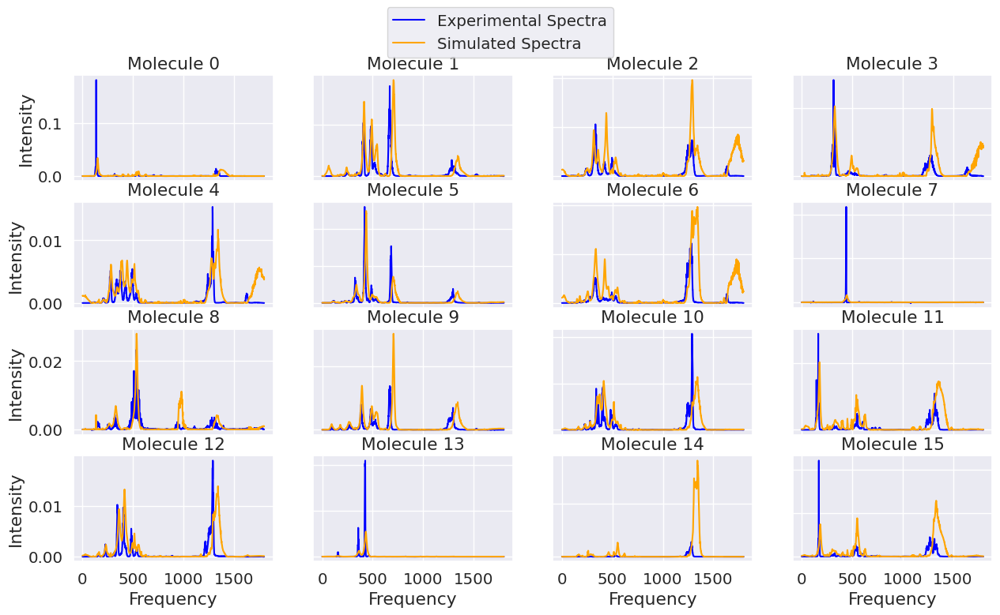

Average SIS: 0.22415756545499438


In [133]:
import math
square_side = int(math.sqrt(len(spectra_to_plot)))
fig, axs = plt.subplots(square_side, square_side)

all_sis = list()

x_id = 0
y_id = 0
for idx, each_spectra_to_plot in enumerate(spectra_to_plot):
    
    if x_id == square_side or y_id == square_side:
        break

    axs[x_id, y_id].plot(each_spectra_to_plot[0], color="blue", label="Experimental Spectra")
    axs[x_id, y_id].plot(each_spectra_to_plot[1], color="orange", label="Simulated Spectra")
    axs[x_id, y_id].set_title(f'Molecule {idx}')
    
    sid = SIDLoss(each_spectra_to_plot[0], each_spectra_to_plot[1])
    sis = 1.0/(1+sid)
    all_sis.append(sis)
    
    y_id += 1
    if y_id == square_side:
        x_id += 1
        y_id = 0


for ax in axs.flat:
    ax.set(xlabel='Frequency', ylabel='Intensity')

# Hide x labels and tick labels for top plots and y ticks for right plots.
for ax in axs.flat:
    ax.label_outer()

handles, labels = plt.gca().get_legend_handles_labels()
fig.legend(handles, labels, loc='upper center')

# plt.savefig('Images/ir_congruence.svg', dpi=300, bbox_inches = "tight")
plt.show()
print(f"Average SIS: {sum(all_sis)/len(all_sis)}")